# **HW 1: Credit Card Churn Prediction**
<hr>

<u>**Members**</u><br>
Tharnarch Thoranisttakul 63340500025<br>
Athimet Aiewcharoen 63340500068
<hr>

## **Function and Import Necessary Libraries**

In [79]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns 
import warnings

from sklearn.feature_selection import SelectKBest, chi2, f_classif
from sklearn.decomposition import PCA

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import plot_confusion_matrix, classification_report,confusion_matrix
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder , RobustScaler

# ignore warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import RepeatedKFold, StratifiedKFold
from sklearn.model_selection import cross_val_score
from scipy.stats import sem

from sklearn.model_selection import GridSearchCV

from sklearn.utils import resample
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import TomekLinks

from sklearn.metrics import precision_recall_curve
from sklearn import metrics

In [80]:
def diagnostic_plots(df, variable:str):
    # function to plot a histogram and a Q-Q plot
    # side by side, for a certain variable
    
    plt.figure(figsize=(15,6))
    plt.subplot(1, 2, 1)
    df[variable].plot.hist()

    plt.subplot(1, 2, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)

    plt.show()  

In [81]:
def checkCorrFF(df):
    plt.figure(figsize=(20,10))
    cor = df.corr()
    # mask = np.zeros_like(cor, dtype=np.bool)
    # mask[np.triu_indices_from(mask)] = True
    sns.heatmap(cor, annot=True, cmap='inferno')
    plt.show()

In [82]:
def checkCorrFT(df, target):
    sns.pairplot(df, hue = target)

In [83]:
def checkOutput(df, col:str, colTarget:str, output:str):
    checkdf = df.loc[df[col] == colTarget]
    return checkdf[output].value_counts()

In [84]:
def IQRdrop(df, col:str):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    df = df.loc[(df[col] >= Q1 - 1.5*IQR) & (df[col] <= Q3 + 1.5*IQR)]
    return df

In [85]:
# evaluate a model with a given number of repeats
def evaluate_model(X, y, repeats,scores):
	# prepare the cross-validation procedure
	cv = RepeatedKFold(n_splits=10, n_repeats=repeats, random_state=1)
	# create model
	model = LogisticRegression()
	# evaluate model
	scores = cross_val_score(model, X, y, scoring=scores, cv=cv, n_jobs=-1)
	return scores

## **Data Exploration**

There are a total of 23 features in this dataset which are:

|Feature Name|Description|Data Type|
|-|-|-|
|<font color='green'>CLIENTNUM</font>|Unique identifier for the customer holding the account|
|<font color='green'>Attrition_Flag</font>|Internal event (customer activity) variable (Existing = 1, Attrited = 0)|<font color='red'>Categorical</font> [Output]|
|<font color='green'>Customer_Age</font>|Customer's Age in Years|<font color='red'>Numerical</font>|
|<font color='green'>Gender</font>|(M = Male, F = Female)|<font color='red'>Categorical</font>|
|<font color='green'>Dependent_Count</font>|Number of dependents|<font color='red'>Numerical</font>|
|<font color='green'>Education_Level</font>|Educational Qualification of the account holder (Uneducated, High School, College, Graduate, Post-Graduate, Doctorate, Unknown)|<font color='red'>Categorical</font>|
|<font color='green'>Marital_Status</font>|(Married, Single, Divorced, Unknown)|<font color='red'>Categorical</font>|
|<font color='green'>Income_Category</font>|Annual Income Category of the account holder (< $40K, $40K - 60K, $60K - $80K, $80K-$120K, >$120K)|<font color='red'>Categorical</font>|
|<font color='green'>Card_Category</font>|Type of Card (Blue, Silver, Gold, Platinum)</font>|<font color='red'>Categorical</font>|
|<font color='green'>Months_on_book</font>|Period of relationship with bank|<font color='red'>Numerical</font>|
|<font color='green'>Total_Relationship_Count</font>|Total no. of products held by the customer|<font color='red'>Numerical</font>|
|<font color='green'>Months_Inactive_12_mon</font>|No. of months inactive in the last 12 months|<font color='red'>Numerical</font>|
|<font color='green'>Contacts_Count_12_mon</font>|No. of Contacts in the last 12 months|<font color='red'>Numerical</font>|
|<font color='green'>Credit_Limit</font>|Credit Limit on the Credit Card|<font color='red'>Numerical</font>|
|<font color='green'>Total_Revolving_Bal</font>|Total Revolving Balance on the Credit Card|<font color='red'>Numerical</font>|
|<font color='green'>Avg_Open_To_Buy</font>|Open to Buy Credit Line (Average of last 12 months)|<font color='red'>Numerical</font>|
|<font color='green'>Total_Amt_Chng_Q4_Q1</font>|Change in Transaction Amount (Q4 over Q1)|<font color='red'>Numerical</font>|
|<font color='green'>Total_Trans_Amt</font>|Total Transaction Amount (Last 12 months)|<font color='red'>Numerical</font>|
|<font color='green'>Total_Trans_Ct</font>|Total Transaction Count (Last 12 months)|<font color='red'>Numerical</font>|
|<font color='green'>Total_Ct_Chng_Q4_Q1</font>|Change in Transaction Count (Q4 over Q1)|<font color='red'>Numerical</font>|
|<font color='green'>Avg_Utilization_Ratio</font>|Average Card Utilization Ratio|<font color='red'>Numerical</font>|
|<font color='green'>Naive_Bayes_Classifier...</font>|Naive Bayes||
|<font color='green'>Naive_Bayes_Classifier...</font>|Naive Bayes||

### **Import Dataset**

In [86]:
dfOri = df = pd.read_csv('HWdata/credit_card_churn.csv')
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998


In [87]:
df.tail()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462,0.000191,0.999810
10123,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,...,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,0.995270,0.004729
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,...,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,0.997880,0.002118
10125,717406983,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,...,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,0.996710,0.003294
10126,714337233,Attrited Customer,43,F,2,Graduate,Married,Less than $40K,Silver,25,...,10388.0,1961,8427.0,0.703,10294,61,0.649,0.189,0.996620,0.003377


In [88]:
df.shape

(10127, 23)

We can see that this dataset has 23 features and 10127 data.

In [89]:
df.columns

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'],
      dtype='object')

In [90]:
df.dtypes

CLIENTNUM                                                                                                                               int64
Attrition_Flag                                                                                                                         object
Customer_Age                                                                                                                            int64
Gender                                                                                                                                 object
Dependent_count                                                                                                                         int64
Education_Level                                                                                                                        object
Marital_Status                                                                                                                         object
Income

### **Drop Unnecessary Features**

Since '<font color='orange'>CLIENTNUM</font>' is a unique classifier for each customer, we will drop this feature.
The last 2 features, '<font color='orange'>Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1</font>' and '<font color='orange'>Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2</font>', are for Naive Bayes Classifier, which we won't be using in this assignment, we will also drop these features.


In [91]:
df.drop(
['CLIENTNUM','Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'], 
axis=1, inplace=True)
df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [92]:
df.shape

(10127, 20)

In [93]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

After dropping the unnecessary features, we are left with 20 features.

In which, there are:

- 6 features that are '<font color='green'>object</font>', which means that they are '<font color='red'>Categorical Features</font>'.
- 14 features that are '<font color='green'>int64</font>' and '<font color='green'>float64</font>', which means that they are '<font color='red'>Numerical Features</font>'

### **Sort Features**
**Order:**
1. Numerical Features
2. Categorical Features
3. Output

**Separate Numerical Features from Dataset**

In [94]:
dfNum = df.select_dtypes(include=['int64', 'float64'])

**Separate Categorical Features from Dataset**

In [95]:
dfCate = df.select_dtypes(include=['object'])
dfCate = dfCate.iloc[:,1:]

**Separate Output from Dataset**

In [96]:
dfOut = df.iloc[:,0:1]

**Concatenate Separated Data**

In [97]:
df = pd.concat([dfNum, dfCate, dfOut], axis=1)
df['Attrition_Flag'] = df['Attrition_Flag'].map({'Existing Customer' : 1,'Attrited Customer': 0})
df

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,Attrition_Flag
0,45,3,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,M,High School,Married,$60K - $80K,Blue,1
1,49,5,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,F,Graduate,Single,Less than $40K,Blue,1
2,51,3,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,M,Graduate,Married,$80K - $120K,Blue,1
3,40,4,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,F,High School,Unknown,Less than $40K,Blue,1
4,40,3,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,M,Uneducated,Married,$60K - $80K,Blue,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,50,2,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462,M,Graduate,Single,$40K - $60K,Blue,1
10123,41,2,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,M,Unknown,Divorced,$40K - $60K,Blue,0
10124,44,1,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,F,High School,Married,Less than $40K,Blue,0
10125,30,2,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,M,Graduate,Unknown,$40K - $60K,Blue,0


### **Model Training w/o Data Preprocessing**

In [98]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

#get the dummy variables for the categorical variables
dfbm = pd.get_dummies(df)

xbm = dfbm.drop(['Attrition_Flag'], axis = 1)
ybm = dfbm['Attrition_Flag']

xbm_train,xbm_test,ybm_train,ybm_test = train_test_split(xbm,ybm,test_size = 0.2,random_state = 0)

clfbm = LogisticRegression()
clfbm.fit(xbm_train,ybm_train)
print("model score: %.8f" % clfbm.score(xbm_test, ybm_test))

model score: 0.89338598


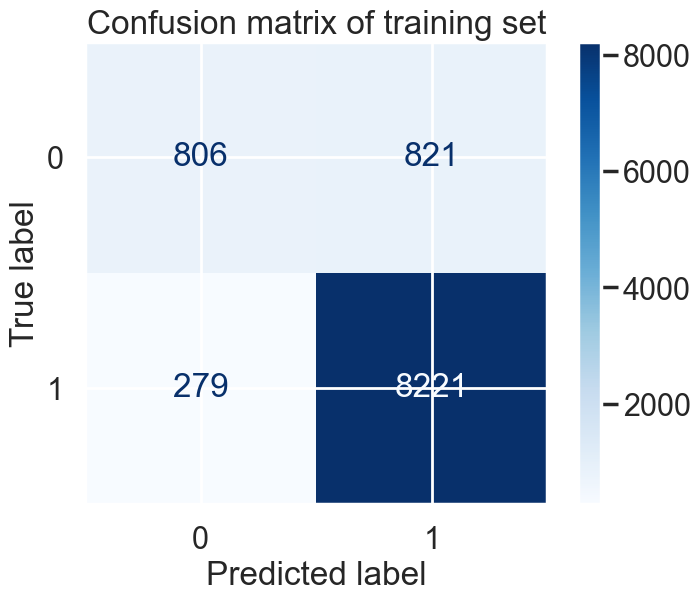

In [99]:
# Plot confusion matrix of training set
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(clfbm,
                      xbm,
                      ybm,
                      display_labels=list(set(ybm_test)),
                      cmap=plt.cm.Blues) 
plt.title('Confusion matrix of training set')
plt.show()  

In [100]:
# Classification report
from sklearn.metrics import classification_report,confusion_matrix
ybm_pred_train = clfbm.predict(xbm_train)
print("Classification report on Train data\n=======================")
print(classification_report(y_true=ybm_train, y_pred=ybm_pred_train))
print("Confusion matrix on Train data\n=======================")

print(confusion_matrix(y_true=ybm_train, y_pred=ybm_pred_train))

Classification report on Train data
              precision    recall  f1-score   support

           0       0.75      0.50      0.60      1318
           1       0.91      0.97      0.94      6783

    accuracy                           0.89      8101
   macro avg       0.83      0.73      0.77      8101
weighted avg       0.88      0.89      0.88      8101

Confusion matrix on Train data
[[ 654  664]
 [ 220 6563]]


In [101]:
# Classification report
from sklearn.metrics import classification_report,confusion_matrix
ybm_pred_test = clfbm.predict(xbm_test)
print("Classification report on Test data\n=======================")
print(classification_report(y_true=ybm_test, y_pred=ybm_pred_test))
print("Confusion matrix on Test data\n=======================")

print(confusion_matrix(y_true=ybm_test, y_pred=ybm_pred_test))

Classification report on Test data
              precision    recall  f1-score   support

           0       0.72      0.49      0.58       309
           1       0.91      0.97      0.94      1717

    accuracy                           0.89      2026
   macro avg       0.82      0.73      0.76      2026
weighted avg       0.88      0.89      0.88      2026

Confusion matrix on Test data
[[ 152  157]
 [  59 1658]]


### **Check Values of Numerical Features**

In [102]:
df.isnull().sum()

Customer_Age                0
Dependent_count             0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
Gender                      0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Attrition_Flag              0
dtype: int64

In [103]:
df.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Attrition_Flag
count,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894,0.839340
std,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691,0.367235
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000,0.000000
25%,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000,1.000000
50%,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000,1.000000
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000,1.000000
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000,1.000000


<AxesSubplot:xlabel='Avg_Utilization_Ratio', ylabel='Count'>

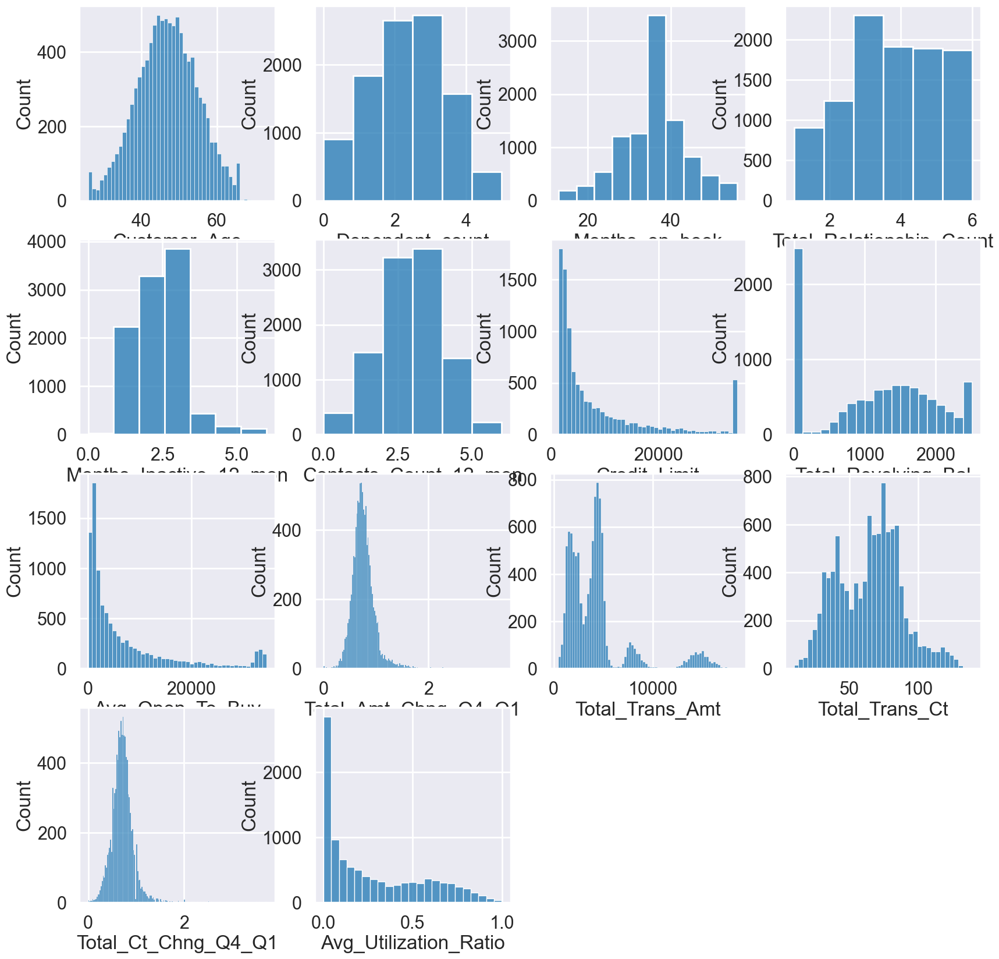

In [104]:
# plot numerical data
plt.figure(figsize=(20,20))
plt.subplot(441) 
sns.histplot(df['Customer_Age'])
plt.subplot(442) 
sns.histplot(df['Dependent_count'],bins=6)
plt.subplot(443) 
sns.histplot(df['Months_on_book'],bins=10)
plt.subplot(444) 
sns.histplot(df['Total_Relationship_Count'],bins=6)
plt.subplot(445) 
sns.histplot(df['Months_Inactive_12_mon'],bins=7)
plt.subplot(446) 
sns.histplot(df['Contacts_Count_12_mon'],bins=6)
plt.subplot(447) 
sns.histplot(df['Credit_Limit'])
plt.subplot(448) 
sns.histplot(df['Total_Revolving_Bal'])
plt.subplot(449) 
sns.histplot(df['Avg_Open_To_Buy'])
plt.subplot(4,4,10) 
sns.histplot(df['Total_Amt_Chng_Q4_Q1'])
plt.subplot(4,4,11)
sns.histplot(df['Total_Trans_Amt'])
plt.subplot(4,4,12)
sns.histplot(df['Total_Trans_Ct'])
plt.subplot(4,4,13)
sns.histplot(df['Total_Ct_Chng_Q4_Q1'])
plt.subplot(4,4,14)
sns.histplot(df['Avg_Utilization_Ratio'])

What we got from plotting values of numerical features:

|Feature Names|Normally Distributed|
|-|-|
|Customer_Age|Yes|
|Dependent_Count|Yes|
|Months_on_book|Yes|
|Total_Relationship_Count|No|
|Months_Inactive_12_mon|Almost|
|Contacts_Count_12_mon|Yes|
|Credit_Limit|No|
|Total_Revolving_Bal|No|
|Avg_Open_To_Buy|No|
|Total_Amt_Chng_Q4_Q1|Almost|
|Total_Trans_Amt|No|
|Total_Trans_Ct|Almost|
|Total_Ct_Chng_Q4_Q1|Almost|
|Avg_Utilization_Ratio|No|

### **Check Values of Categorical Features**

In [105]:
df['Gender'].value_counts()

F    5358
M    4769
Name: Gender, dtype: int64

In [106]:
# Calculate Percentage of Gender
100*df['Gender'].value_counts()/len(df)

F    52.908068
M    47.091932
Name: Gender, dtype: float64

In [107]:
df['Education_Level'].value_counts()

Graduate         3128
High School      2013
Unknown          1519
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64

In [108]:
# Calculate Percentage of Education Level
100*df['Education_Level'].value_counts()/len(df)

Graduate         30.887726
High School      19.877555
Unknown          14.999506
Uneducated       14.683519
College          10.002962
Post-Graduate     5.095290
Doctorate         4.453441
Name: Education_Level, dtype: float64

In [109]:
df['Marital_Status'].value_counts()

Married     4687
Single      3943
Unknown      749
Divorced     748
Name: Marital_Status, dtype: int64

In [110]:
# Calculate Percentage of Marital Status
100*df['Marital_Status'].value_counts()/len(df)

Married     46.282216
Single      38.935519
Unknown      7.396070
Divorced     7.386195
Name: Marital_Status, dtype: float64

In [111]:
df['Income_Category'].value_counts()

Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Unknown           1112
$120K +            727
Name: Income_Category, dtype: int64

In [112]:
# Calculate Percentage of Income Category
100*df['Income_Category'].value_counts()/len(df)

Less than $40K    35.163425
$40K - $60K       17.675521
$80K - $120K      15.157500
$60K - $80K       13.844179
Unknown           10.980547
$120K +            7.178829
Name: Income_Category, dtype: float64

In [113]:
df['Card_Category'].value_counts()

Blue        9436
Silver       555
Gold         116
Platinum      20
Name: Card_Category, dtype: int64

In [114]:
# Calculate Percentage of Card Category
100*df['Card_Category'].value_counts()/len(df)

Blue        93.176656
Silver       5.480399
Gold         1.145453
Platinum     0.197492
Name: Card_Category, dtype: float64

<AxesSubplot:title={'center':'Card Category'}>

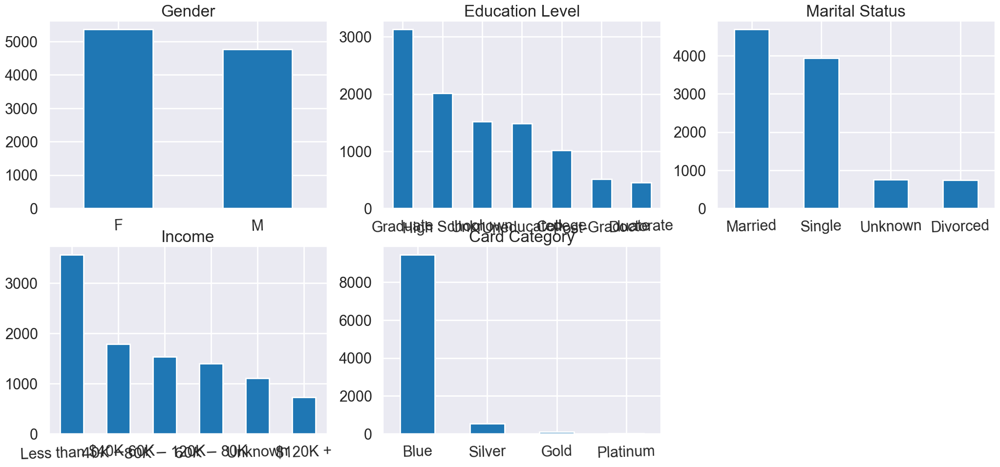

In [115]:
# plot categorical data
plt.figure(figsize=(25,11))
plt.subplot(231) 
df['Gender'].value_counts(normalize=False).plot.bar(title= 'Gender',rot=2) 
plt.subplot(232) 
df['Education_Level'].value_counts(normalize=False).plot.bar(title= 'Education Level',rot=2) 
plt.subplot(233) 
df['Marital_Status'].value_counts(normalize=False).plot.bar(title= 'Marital Status',rot=2)
plt.subplot(234) 
df['Income_Category'].value_counts(normalize=False).plot.bar(title= 'Income',rot=2)
plt.subplot(235) 
df['Card_Category'].value_counts(normalize=False).plot.bar(title= 'Card Category',rot=2)

What we got from plotting values of categorical features:

|Feature Names|What we got|
|-|-|
|Gender|There are nearly the same amount of male and female.|
|Education_Level|Most of the people in this dataset are 'Graduate' and around 15% of the people are 'Unknown'|
|Marital_Status|46% of this data are 'Married', 39% are 'Single' and the rest are 'Unknown' or 'Divorced'|
|Income_Category|Most people in this dataset have 'less than 40K' income|
|Card_Category|People in this dataset mostly hold blue cards (more than 93%) and the rest hold the other 3 cards (less than 7%).|

### **Check Behaviour of Attrition_Flag**

In [116]:
dfAtt = df[df['Attrition_Flag'] == 0]
dfAtt

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,Attrition_Flag
21,62,0,49,2,3,3,1438.3,0,1438.3,1.047,692,16,0.600,0.000,F,Graduate,Married,Less than $40K,Blue,0
39,66,0,56,5,4,3,7882.0,605,7277.0,1.052,704,16,0.143,0.077,F,Doctorate,Married,Unknown,Blue,0
51,54,1,40,2,3,1,1438.3,808,630.3,0.997,705,19,0.900,0.562,F,Graduate,Married,Less than $40K,Blue,0
54,56,2,36,1,3,3,15769.0,0,15769.0,1.041,602,15,0.364,0.000,M,Graduate,Married,$120K +,Blue,0
61,48,2,35,2,4,4,34516.0,0,34516.0,0.763,691,15,0.500,0.000,M,Graduate,Married,$60K - $80K,Silver,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10119,55,3,47,4,3,3,14657.0,2517,12140.0,0.166,6009,53,0.514,0.172,F,Uneducated,Single,Unknown,Blue,0
10123,41,2,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,M,Unknown,Divorced,$40K - $60K,Blue,0
10124,44,1,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,F,High School,Married,Less than $40K,Blue,0
10125,30,2,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,M,Graduate,Unknown,$40K - $60K,Blue,0


In [117]:
dfExist = df[df['Attrition_Flag'] == 1]
dfExist

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,Attrition_Flag
0,45,3,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,M,High School,Married,$60K - $80K,Blue,1
1,49,5,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,F,Graduate,Single,Less than $40K,Blue,1
2,51,3,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,M,Graduate,Married,$80K - $120K,Blue,1
3,40,4,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,F,High School,Unknown,Less than $40K,Blue,1
4,40,3,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,M,Uneducated,Married,$60K - $80K,Blue,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10116,46,5,36,1,2,3,13187.0,2241,10946.0,0.689,15354,112,0.931,0.170,M,College,Single,$80K - $120K,Blue,1
10117,57,2,40,6,3,4,17925.0,1909,16016.0,0.712,17498,111,0.820,0.106,M,Graduate,Married,$80K - $120K,Blue,1
10120,54,1,34,5,2,0,13940.0,2109,11831.0,0.660,15577,114,0.754,0.151,M,High School,Single,$60K - $80K,Blue,1
10121,56,1,50,4,1,4,3688.0,606,3082.0,0.570,14596,120,0.791,0.164,F,Graduate,Single,Less than $40K,Blue,1


### **Plot Features of Attrited Customers**

<AxesSubplot:title={'center':'Card Category'}>

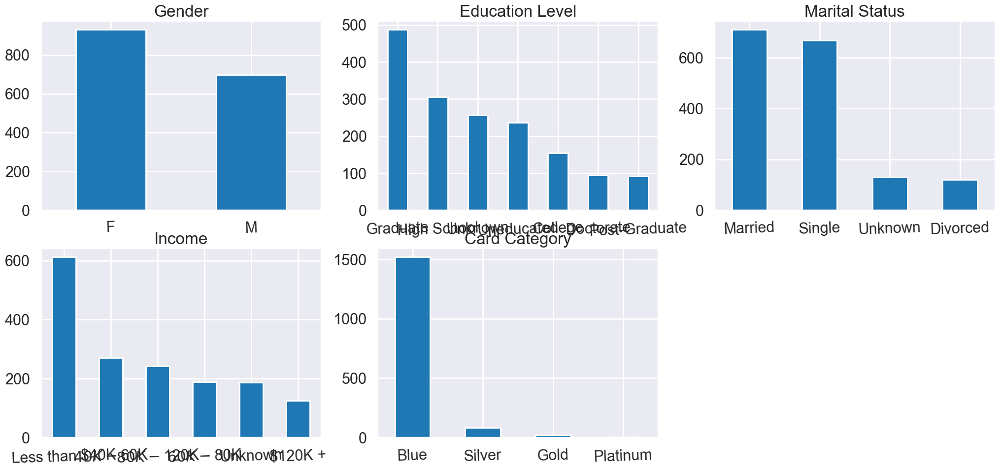

In [118]:
# plot categorical data
plt.figure(figsize=(25,11))
plt.subplot(231) 
dfAtt['Gender'].value_counts(normalize=False).plot.bar(title= 'Gender',rot=2) 
plt.subplot(232) 
dfAtt['Education_Level'].value_counts(normalize=False).plot.bar(title= 'Education Level',rot=2) 
plt.subplot(233) 
dfAtt['Marital_Status'].value_counts(normalize=False).plot.bar(title= 'Marital Status',rot=2)
plt.subplot(234) 
dfAtt['Income_Category'].value_counts(normalize=False).plot.bar(title= 'Income',rot=2)
plt.subplot(235) 
dfAtt['Card_Category'].value_counts(normalize=False).plot.bar(title= 'Card Category',rot=2)

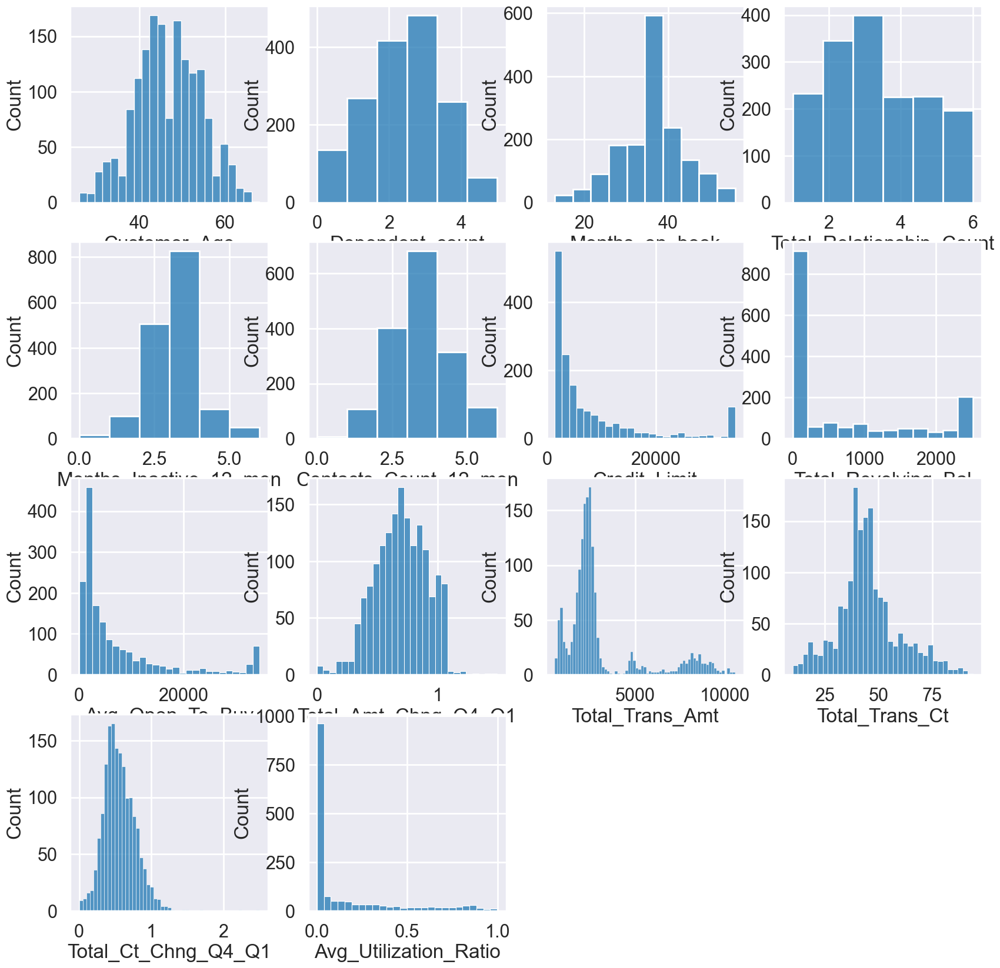

In [119]:
# plot numerical data
plt.figure(figsize=(20,20))

for idx, col in enumerate(dfNum.columns):
    if col not in ['Attrition_Flag']:
        plt.subplot(4,4,idx+1)
        if col in ['Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon']:
            sns.histplot(dfAtt[col],bins=6)
        elif col in ['Months_on_book']:
            sns.histplot(dfAtt[col],bins=10)
        else:
            sns.histplot(dfAtt[col])

### **Plot Features of Existing Customers**

<AxesSubplot:title={'center':'Card Category'}>

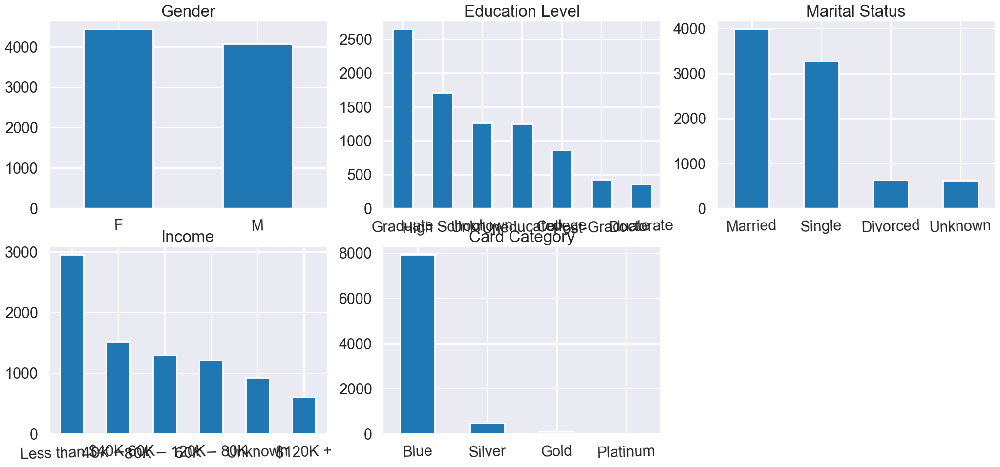

In [120]:
# plot categorical data
plt.figure(figsize=(25,11))
plt.subplot(231) 
dfExist['Gender'].value_counts(normalize=False).plot.bar(title= 'Gender',rot=2) 
plt.subplot(232) 
dfExist['Education_Level'].value_counts(normalize=False).plot.bar(title= 'Education Level',rot=2) 
plt.subplot(233) 
dfExist['Marital_Status'].value_counts(normalize=False).plot.bar(title= 'Marital Status',rot=2)
plt.subplot(234) 
dfExist['Income_Category'].value_counts(normalize=False).plot.bar(title= 'Income',rot=2)
plt.subplot(235) 
dfExist['Card_Category'].value_counts(normalize=False).plot.bar(title= 'Card Category',rot=2)

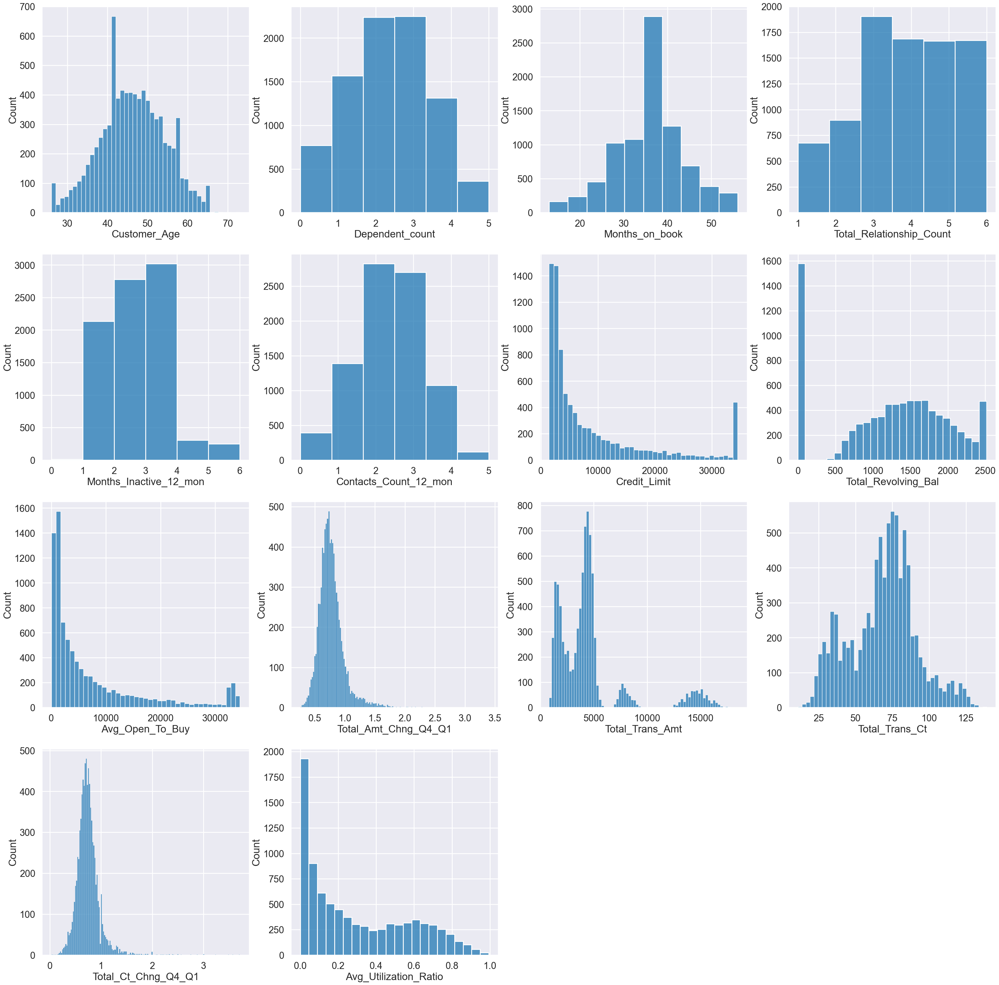

In [121]:
# plot numerical data
plt.figure(figsize=(40,40))

for idx, col in enumerate(dfNum.columns):
    if col not in ['Attrition_Flag']:
        plt.subplot(4,4,idx+1)
        if col in ['Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon']:
            sns.histplot(dfExist[col],bins=6)
        elif col in ['Months_on_book']:
            sns.histplot(dfExist[col],bins=10)
        else:
            sns.histplot(dfExist[col])

### **Pairplot Interesting Features**

In [122]:
# sns.pairplot(df[['Attrition_Flag','Total_Relationship_Count', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1','Avg_Utilization_Ratio']], diag_kind="hist", hue="Attrition_Flag")

Good and Bad things of this dataset:

|Good Things|Explanation|
|-|-|
|Data Distribution|Most Numerical data are normally distributed.|
|Filled Data in Numerical Features|There are no missing data (NaN) or unknown in numerical features of this dataset.|

<hr>

|Bad Things|Explanation|
|-|-|
|Data Explanation|Most features come with little to no explanation or bad explanation, eg. Avg_Open_To_Buy.|
|'Card_Category' Features|This feature's data are mostly 'Blue' (around 93%).|
|Unknown Data|Unclear explanation of what unknown data means and there are a lot of them in categorical features.|
|Data Variation|As we can see when pairplotting, variance between features are quite low and variance within class are quite high, which means that data variation is very bad.|

**NOTE**: For all 'Unknown' data in categorical features, we assumed 'Unknown' as a type of data because there are quite a lot of 'Unknown' data.

Furthermore, because we are dealing with a credit card dataset, which can be considered as a dataset provided by a bank, those 'Unknown' data might be undisclosed information of the customers.

### **Check Correlation between Numerical Features**

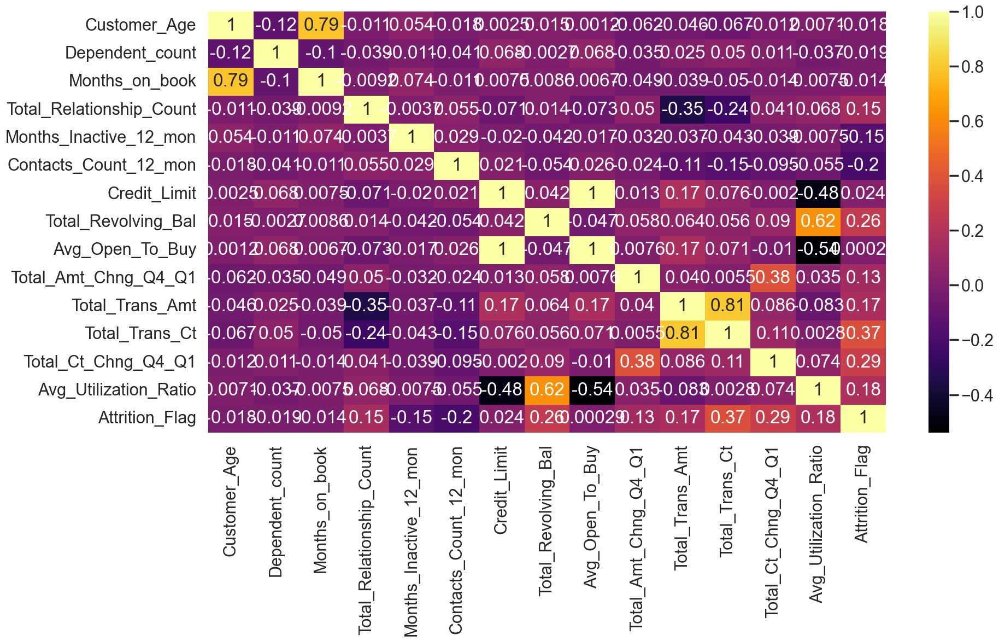

In [123]:
checkCorrFF(df)

From the heatmap above, we can drop these features:

|Feature Names|Reasons|
|-|-|
|Customer_Age|Looking at the heatmap, it correlates with 'Months_on_Book' (79%). We assumed that 'Months_on_Book' is more useful than 'Customer_Age'.|
|Credit_Limit|Looking at the heatmap, 'Credit_Limit' and 'Avg_Open_To_Buy' perfectly correlate to each other.|
|Total_Trans_Amt|Looking at the heatmap, it correlates with 'Total_Trans_Ct' (81%) and correlates with other features quite a lot.|
|Total_Amt_Chng_Q4_Q1|Looking at the heatmap, it correlates with 'Total_Ct_Chng_Q4_Q1' (38%).|
|Avg_Utilization_Ratio|Looking at the heatmap, it correlates too much with 3 features, 'Credit_Limit', 'Total_Revolving_Bal' and 'Avg_Open_To_Buy'.|

# **Resampling Method 1** : SMOTE (Synthetic Minority Oversampling TEchnique)
<hr>

## **Data Preprocessing**
### **Label and One hot Encoding**

<AxesSubplot:ylabel='Type'>

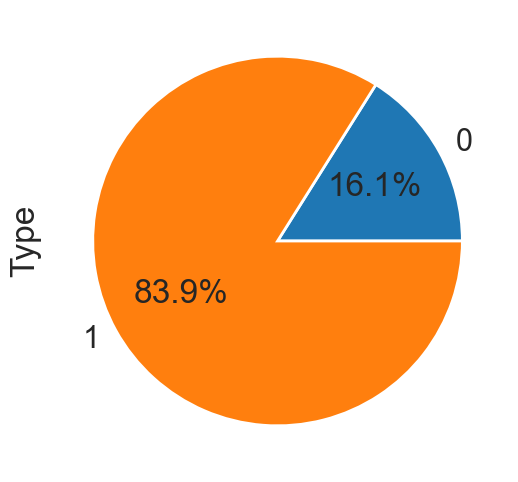

In [124]:
sns.set_style("darkgrid")
sns.set_context("poster")
plt.rcParams["figure.figsize"] = [8,6]

df.groupby('Attrition_Flag').size().plot(kind='pie',
                                                y = "Attrition_Flag",
                                                label = "Type",
                                                autopct='%1.1f%%')

In [125]:
df_LE = df.copy()

df_LE['Gender'] = df_LE['Gender'].apply(lambda x: ['M', 'F'].index(x))
df_LE['Education_Level'] = df_LE['Education_Level'].apply(lambda x: ['Unknown', 'Uneducated', 'High School', 'College', 'Graduate', 'Post-Graduate', 'Doctorate'].index(x))
df_LE['Income_Category'] = df_LE['Income_Category'].apply(lambda x: ['Unknown', 'Less than $40K', '$40K - $60K', '$60K - $80K', '$80K - $120K', '$120K +'].index(x))

df_LE['Card_Category'] = df_LE['Card_Category'].map({'Silver' : 'NotBlue','Gold': 'NotBlue','Platinum': 'NotBlue'})
# df_LE['Card_Category'] = df_LE['Card_Category'].apply(lambda x: ['Blue', 'Silver', 'Gold', 'Platinum'].index(x))

x_LE = df_LE.drop(['Attrition_Flag'], axis = 1)
y_LE = df_LE['Attrition_Flag']
x_LE = pd.get_dummies(x_LE)

df_LE = pd.concat([x_LE, y_LE], axis=1)

df_LE

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Avg_Utilization_Ratio,Gender,Education_Level,Income_Category,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Card_Category_NotBlue,Attrition_Flag
0,45,3,39,5,1,3,12691.0,777,11914.0,1.335,...,0.061,0,2,3,0,1,0,0,0,1
1,49,5,44,6,1,2,8256.0,864,7392.0,1.541,...,0.105,1,4,1,0,0,1,0,0,1
2,51,3,36,4,1,0,3418.0,0,3418.0,2.594,...,0.000,0,4,4,0,1,0,0,0,1
3,40,4,34,3,4,1,3313.0,2517,796.0,1.405,...,0.760,1,2,1,0,0,0,1,0,1
4,40,3,21,5,1,0,4716.0,0,4716.0,2.175,...,0.000,0,1,3,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,50,2,40,3,2,3,4003.0,1851,2152.0,0.703,...,0.462,0,4,2,0,0,1,0,0,1
10123,41,2,25,4,2,3,4277.0,2186,2091.0,0.804,...,0.511,0,0,2,1,0,0,0,0,0
10124,44,1,36,5,3,4,5409.0,0,5409.0,0.819,...,0.000,1,2,1,0,1,0,0,0,0
10125,30,2,36,4,3,3,5281.0,0,5281.0,0.535,...,0.000,0,4,2,0,0,0,1,0,0


### **Drop data for Final Test**

In [126]:
X = df_LE.drop(['Attrition_Flag'], axis=1)
y = df_LE['Attrition_Flag']
df_LE['Attrition_Flag'].value_counts()

1    8500
0    1627
Name: Attrition_Flag, dtype: int64

In [127]:

df_LE_x,df_LE_check_x,df_LE_y,df_LE_check_y = train_test_split(X, y, test_size = 0.05, random_state = 0)

df_LE = pd.concat([df_LE_x, df_LE_y], axis=1)
df_LE_check = pd.concat([df_LE_check_x, df_LE_check_y], axis=1)
df_LE_check.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Avg_Utilization_Ratio,Gender,Education_Level,Income_Category,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Card_Category_NotBlue,Attrition_Flag
count,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000,507.00000,507.000000,507.000000,...,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000
mean,46.289941,2.282051,36.031558,3.903353,2.396450,2.546351,8656.890138,1150.81854,7506.071598,0.765444,...,0.286055,0.532544,2.639053,2.096647,0.059172,0.459566,0.410256,0.071006,0.080868,0.848126
std,8.031605,1.319260,7.934452,1.506419,1.016964,1.110194,9399.394366,802.50074,9427.895168,0.218763,...,0.279280,0.499433,1.654403,1.486610,0.236179,0.498855,0.492366,0.257088,0.272901,0.359253
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.00000,3.000000,0.120000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,41.000000,1.000000,32.000000,3.000000,2.000000,2.000000,2489.000000,503.50000,1159.500000,0.639500,...,0.019500,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,47.000000,2.000000,36.000000,4.000000,2.000000,3.000000,4188.000000,1276.00000,3241.000000,0.736000,...,0.188000,1.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,52.000000,3.000000,41.000000,5.000000,3.000000,3.000000,10812.000000,1743.50000,9738.000000,0.866000,...,0.528000,1.000000,4.000000,3.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000
max,66.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.00000,34516.000000,2.121000,...,0.999000,1.000000,6.000000,5.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [128]:
df_LE_check['Attrition_Flag'].value_counts()

1    430
0     77
Name: Attrition_Flag, dtype: int64

<AxesSubplot:ylabel='Type'>

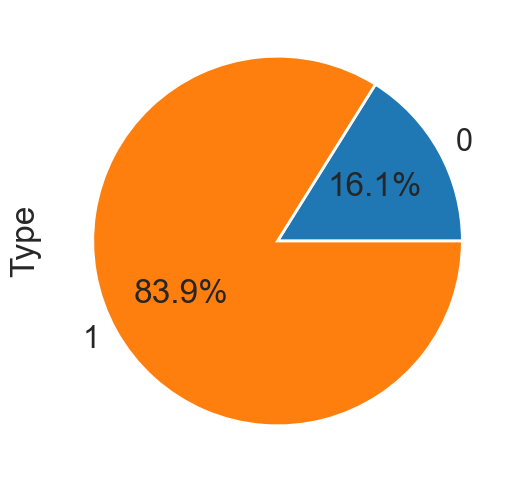

In [129]:
df_LE.groupby('Attrition_Flag').size().plot(kind='pie',
                                                y = "Attrition_Flag",
                                                label = "Type",
                                                autopct='%1.1f%%')

<AxesSubplot:ylabel='Type'>

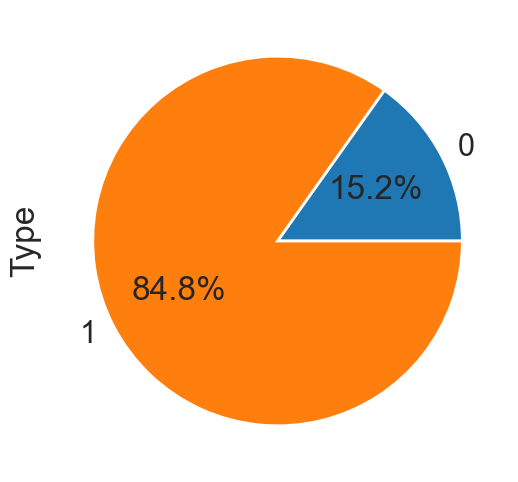

In [130]:
df_LE_check.groupby('Attrition_Flag').size().plot(kind='pie',
                                                y = "Attrition_Flag",
                                                label = "Type",
                                                autopct='%1.1f%%')

### **Resampling**

In [131]:
X = df_LE.drop(['Attrition_Flag'], axis=1)
y = df_LE['Attrition_Flag']

su = SMOTE(random_state=42)
X_su, y_su = su.fit_resample(X, y)
df_upsampled = pd.concat([X_su, y_su], axis=1)

1    8070
0    8070
Name: Attrition_Flag, dtype: int64


<AxesSubplot:ylabel='Type'>

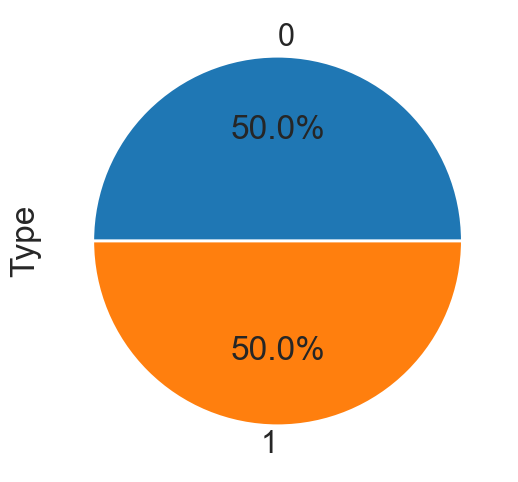

In [132]:
print(df_upsampled["Attrition_Flag"].value_counts())

df_upsampled.groupby('Attrition_Flag').size().plot(kind='pie',
                                       y = "Attrition_Flag",
                                       label = "Type",
                                       autopct='%1.1f%%')

In [133]:
df_upsampled.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Avg_Utilization_Ratio,Gender,Education_Level,Income_Category,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Card_Category_NotBlue,Attrition_Flag
count,16140.000000,16140.000000,16140.000000,16140.000000,16140.000000,16140.000000,16140.000000,16140.000000,16140.000000,16140.000000,...,16140.000000,16140.000000,16140.000000,16140.000000,16140.000000,16140.000000,16140.000000,16140.000000,16140.000000,16140.000000
mean,46.231165,2.215985,35.775155,3.442069,2.354585,2.520384,8453.380808,959.947026,7493.349599,0.733270,...,0.229788,0.476084,2.460409,1.933953,0.046530,0.354957,0.304957,0.047646,0.051301,0.500000
std,7.364357,1.213272,7.391351,1.517129,0.910170,1.022223,9107.723735,888.326682,9123.573538,0.209065,...,0.277072,0.499443,1.606644,1.409465,0.210637,0.478515,0.460403,0.213022,0.220618,0.500015
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,10.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,41.000000,1.000000,32.000000,2.000000,2.000000,2.000000,2393.000000,0.000000,1438.300000,0.605000,...,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,46.000000,2.000000,36.000000,3.000000,2.000000,3.000000,4345.334246,931.000000,3476.638921,0.722322,...,0.096000,0.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000
75%,51.000000,3.000000,40.000000,5.000000,3.000000,3.000000,10685.630241,1698.000000,9728.250000,0.846694,...,0.419351,1.000000,4.000000,3.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,...,0.995000,1.000000,6.000000,5.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [134]:
df.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Attrition_Flag
count,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894,0.839340
std,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691,0.367235
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000,0.000000
25%,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000,1.000000
50%,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000,1.000000
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000,1.000000
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000,1.000000


### **Data Transformation**

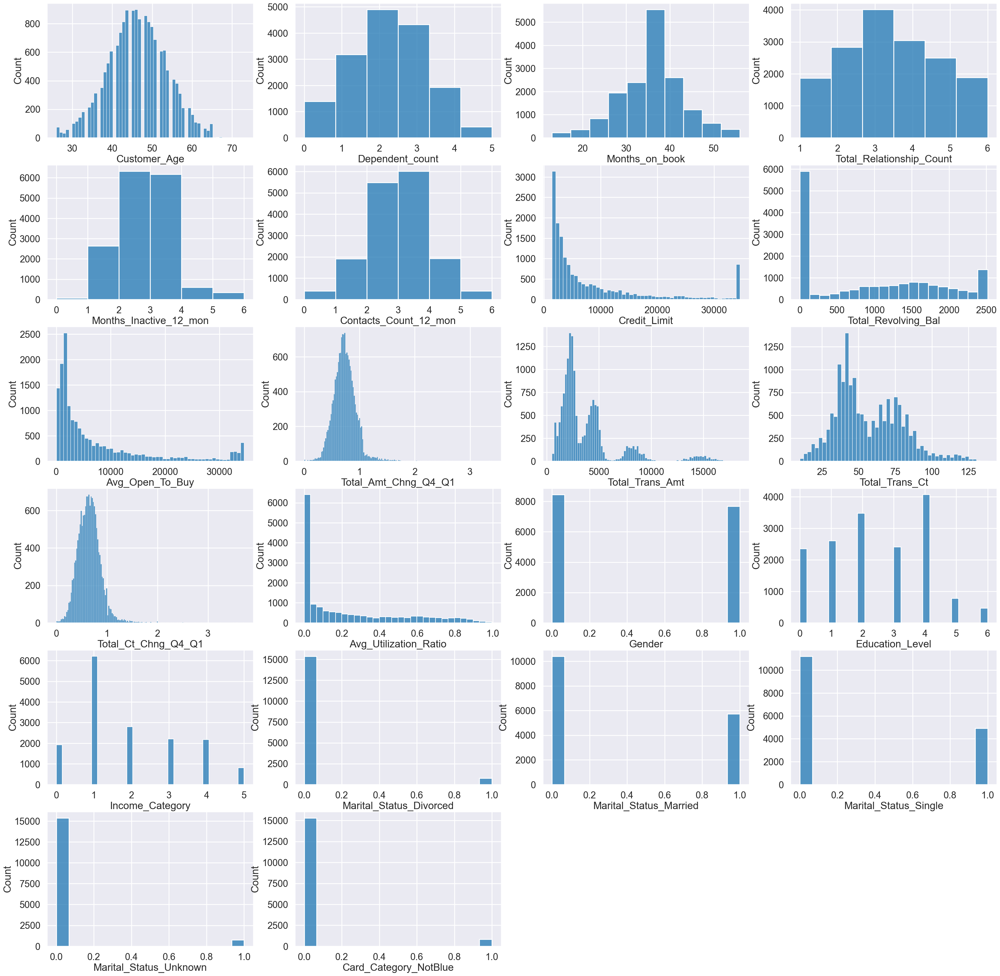

In [135]:
# plot numerical data
plt.figure(figsize=(40,40))

for idx, col in enumerate(df_upsampled.columns):
    if col not in ['Attrition_Flag']:
        plt.subplot(6,4,idx+1)
        if col in ['Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon']:
            sns.histplot(df_upsampled[col],bins=6)
        elif col in ['Months_on_book']:
            sns.histplot(df_upsampled[col],bins=10)
        else:
            sns.histplot(df_upsampled[col])

In [136]:
df_upsampled.columns

Index(['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Gender', 'Education_Level', 'Income_Category',
       'Marital_Status_Divorced', 'Marital_Status_Married',
       'Marital_Status_Single', 'Marital_Status_Unknown',
       'Card_Category_NotBlue', 'Attrition_Flag'],
      dtype='object')

In [137]:
log_var = ['Credit_Limit','Avg_Open_To_Buy',
           'Total_Amt_Chng_Q4_Q1','Total_Ct_Chng_Q4_Q1']

for idx,col in enumerate(log_var):
    df_upsampled[col] = np.log10(df_upsampled[col]+1)

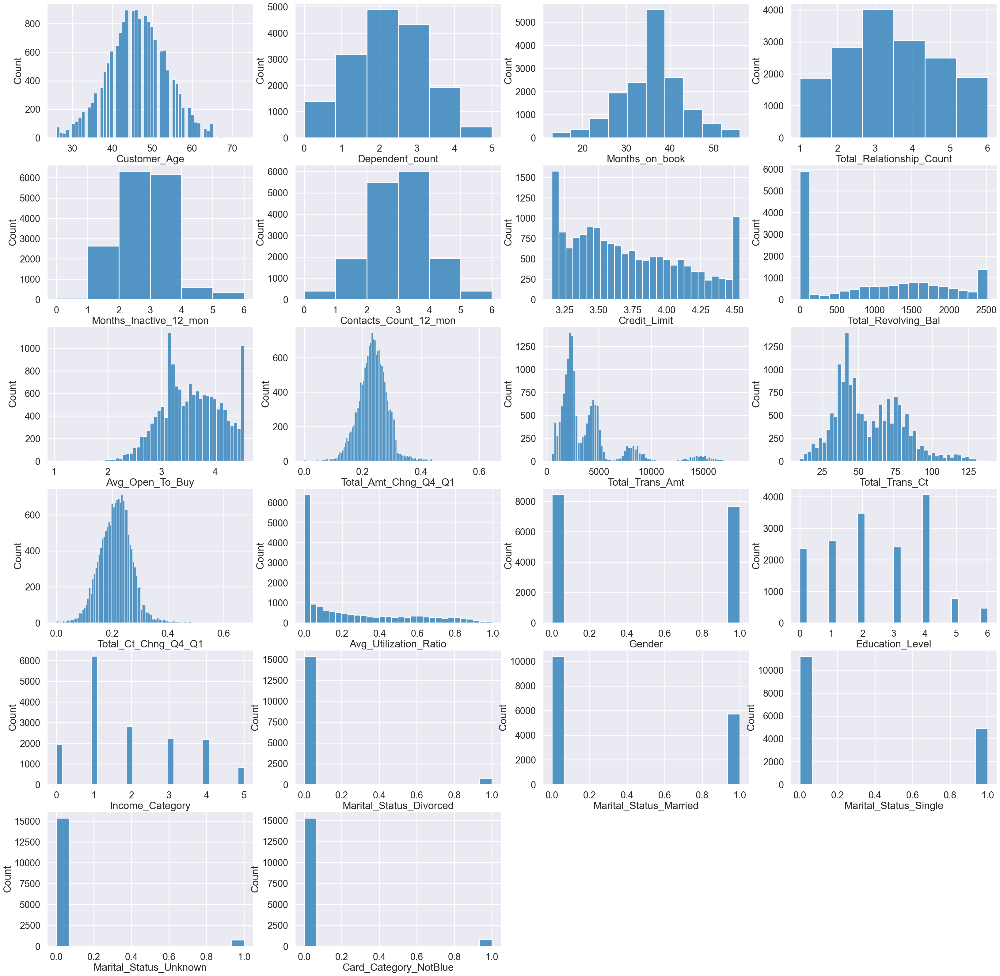

In [138]:
# plot numerical data
plt.figure(figsize=(40,40))

for idx, col in enumerate(df_upsampled.columns):
    if col not in ['Attrition_Flag']:
        plt.subplot(6,4,idx+1)
        if col in ['Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon']:
            sns.histplot(df_upsampled[col],bins=6)
        elif col in ['Months_on_book']:
            sns.histplot(df_upsampled[col],bins=10)
        else:
            sns.histplot(df_upsampled[col])

### **Clear outlier**

In [139]:
# df_upsampled.boxplot(column=[str(i) for count, i in enumerate(df_upsampled.columns) if i != 'Attrition_Flag' and count < 10], figsize=(50,10), grid=False)

#### **Strip Plot**

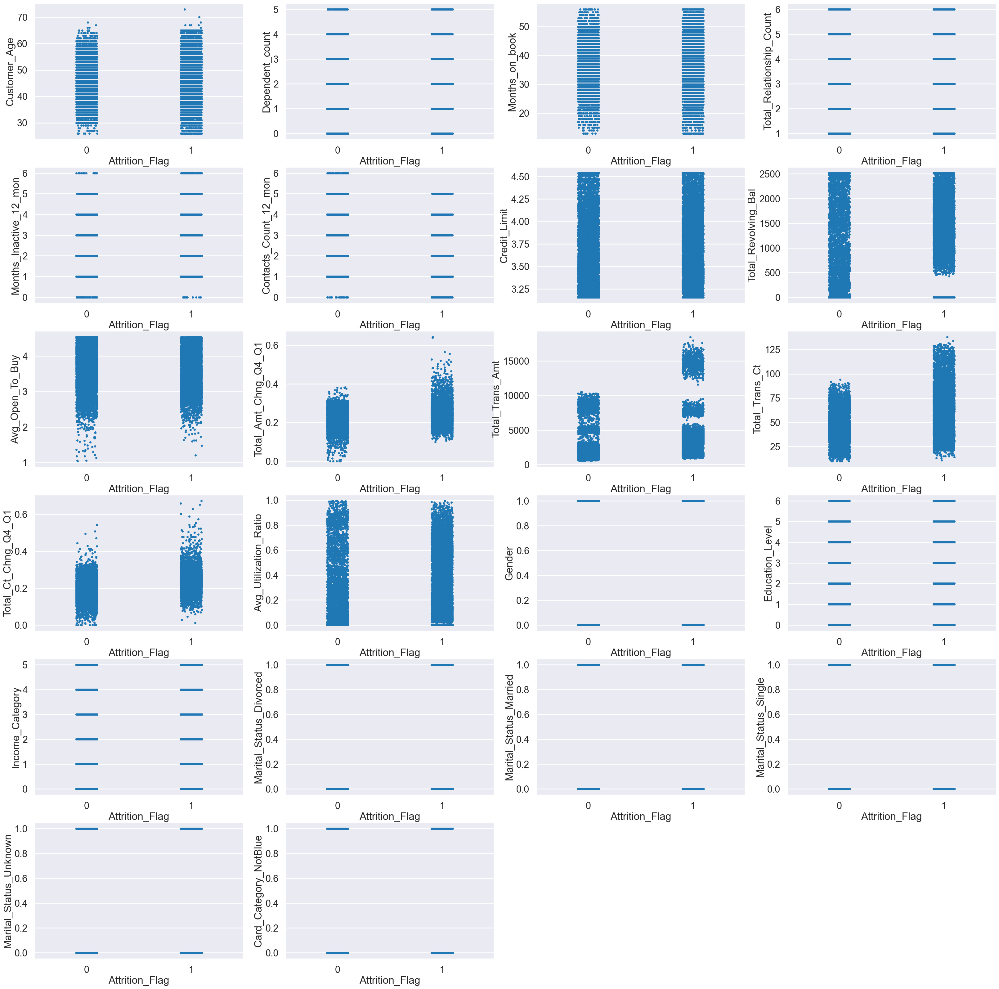

In [140]:
plt.figure(figsize=(40,40))
for idx, col in enumerate(df_upsampled.columns):
    if col not in ["Attrition_Flag"]:
        plt.subplot(6,4,idx+1)
        sns.stripplot(x="Attrition_Flag", y=col, data=df_upsampled)

#### **Remove Outliers**

In [141]:
df_upsampled.columns

Index(['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Gender', 'Education_Level', 'Income_Category',
       'Marital_Status_Divorced', 'Marital_Status_Married',
       'Marital_Status_Single', 'Marital_Status_Unknown',
       'Card_Category_NotBlue', 'Attrition_Flag'],
      dtype='object')

In [142]:
print('Before remove outlier, the shape of df_upsampled: {}'.format(df_upsampled.shape))

df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Avg_Open_To_Buy'] <= 2.0].index & df_upsampled[df_upsampled['Attrition_Flag'] == 0].index)
df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Avg_Open_To_Buy'] <= 2.0].index & df_upsampled[df_upsampled['Attrition_Flag'] == 1].index)
print('df_upsampled.shape after remove outlier Avg_Open_To_Buy : {}'.format(df_upsampled.shape))

df_upsampled = IQRdrop(df_upsampled, 'Total_Amt_Chng_Q4_Q1')
# df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Amt_Chng_Q4_Q1'] >= 0.38].index & df_upsampled[df_upsampled['Attrition_Flag'] == 0].index)
# df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Amt_Chng_Q4_Q1'] >= 0.5].index & df_upsampled[df_upsampled['Attrition_Flag'] == 1].index)
# print('df_upsampled.shape after remove outlier Total_Amt_Chng_Q4_Q1 : {}'.format(df_upsampled.shape))

# df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Trans_Amt'] >= 16000].index & df_upsampled[df_upsampled['Attrition_Flag'] == 1].index)
# print('df_upsampled.shape after remove outlier Total_Trans_Amt : {}'.format(df_upsampled.shape))

# df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Trans_Ct'] >= 127].index & df_upsampled[df_upsampled['Attrition_Flag'] == 1].index)
print('df_upsampled.shape after remove outlier Total_Trans_Amt : {}'.format(df_upsampled.shape))


df_upsampled = IQRdrop(df_upsampled, 'Total_Ct_Chng_Q4_Q1')
# df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Ct_Chng_Q4_Q1'] >= 0.5].index & df_upsampled[df_upsampled['Attrition_Flag'] == 0].index)
# df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Ct_Chng_Q4_Q1'] <= 0.0].index & df_upsampled[df_upsampled['Attrition_Flag'] == 0].index)
# print('df_upsampled.shape after remove outlier Total_Ct_Chng_Q4_Q1 : {}'.format(df_upsampled.shape))

# df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Ct_Chng_Q4_Q1'] >= 0.55].index & df_upsampled[df_upsampled['Attrition_Flag'] == 1].index)
# df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Ct_Chng_Q4_Q1'] <= 0.05].index & df_upsampled[df_upsampled['Attrition_Flag'] == 1].index)
print('df_upsampled.shape after remove outlier Total_Ct_Chng_Q4_Q1 : {}'.format(df_upsampled.shape))

df_upsampled = IQRdrop(df_upsampled, 'Customer_Age')
print('df_upsampled.shape after remove outlier Customer_Age : {}'.format(df_upsampled.shape))

Before remove outlier, the shape of df_upsampled: (16140, 23)
df_upsampled.shape after remove outlier Avg_Open_To_Buy : (16073, 23)
df_upsampled.shape after remove outlier Total_Trans_Amt : (15672, 23)
df_upsampled.shape after remove outlier Total_Ct_Chng_Q4_Q1 : (15449, 23)
df_upsampled.shape after remove outlier Customer_Age : (15444, 23)


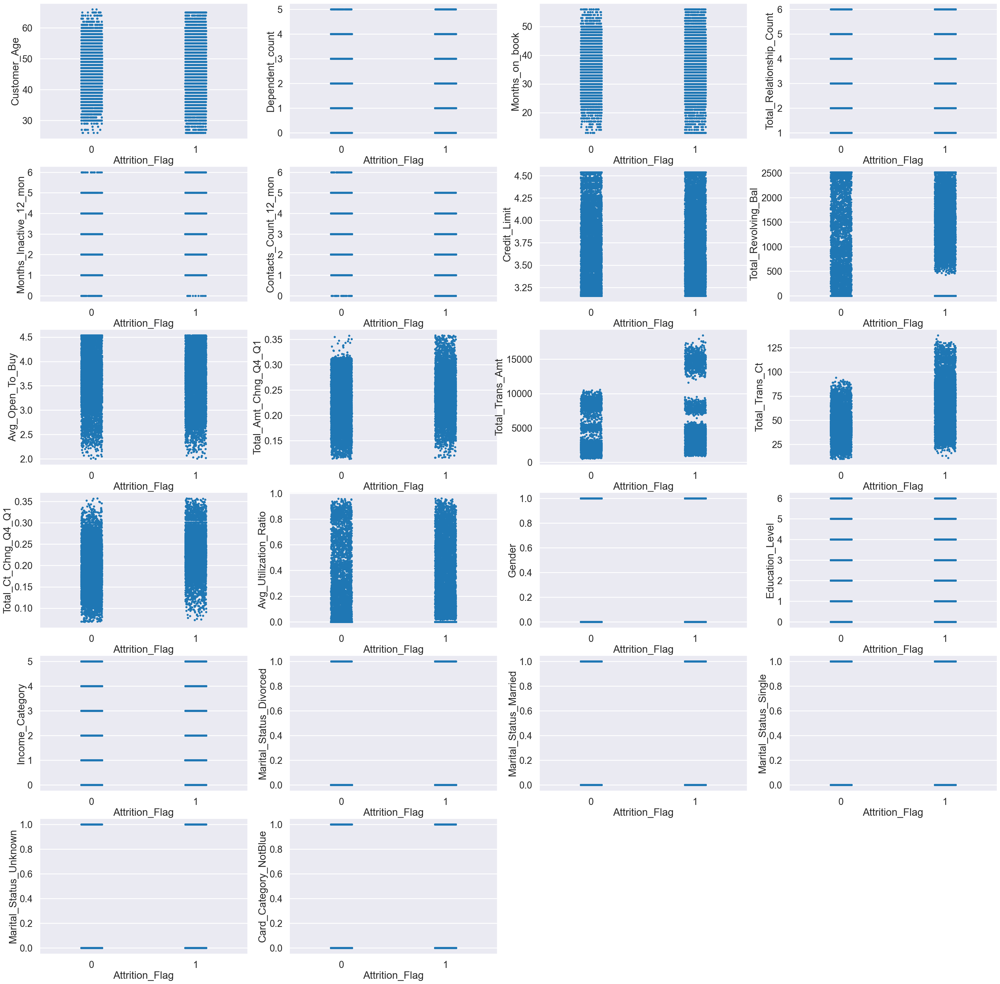

In [143]:
plt.figure(figsize=(40,40))
for idx, col in enumerate(df_upsampled.columns):
    if col not in ["Attrition_Flag"]:
        plt.subplot(6,4,idx+1)
        sns.stripplot(x="Attrition_Flag", y=col, data=df_upsampled)

### **Feature Scaling (Numerical)**

In [144]:
min_max_scaler = MinMaxScaler()

for idx in df_upsampled.columns:
    if idx not in ['Attrition_Flag']:
        df_upsampled[idx]=min_max_scaler.fit_transform(df_upsampled[idx].values.reshape(-1,1))

In [145]:
df_upsampled.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Avg_Utilization_Ratio,Gender,Education_Level,Income_Category,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Card_Category_NotBlue,Attrition_Flag
count,15444.000000,15444.000000,15444.000000,15444.000000,15444.000000,15444.000000,15444.000000,15444.000000,15444.000000,15444.000000,...,15444.000000,15444.000000,15444.000000,15444.000000,15444.00000,15444.000000,15444.000000,15444.000000,15444.000000,15444.000000
mean,0.505968,0.443706,0.530131,0.486791,0.393033,0.419645,0.407141,0.378218,0.615473,0.493902,...,0.234853,0.476496,0.410882,0.385755,0.04662,0.348355,0.309311,0.048174,0.051671,0.495791
std,0.182508,0.242873,0.170960,0.303949,0.151904,0.170281,0.299296,0.352663,0.216131,0.178458,...,0.283998,0.499463,0.267355,0.281556,0.21083,0.476465,0.462225,0.214141,0.221368,0.499998
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.375000,0.200000,0.441860,0.200000,0.333333,0.333333,0.160348,0.000000,0.455955,0.376604,...,0.000000,0.000000,0.166667,0.200000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.500000,0.400000,0.534884,0.400000,0.333333,0.500000,0.348471,0.363925,0.607592,0.498084,...,0.096674,0.000000,0.333333,0.200000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.625000,0.600000,0.627907,0.800000,0.500000,0.500000,0.629027,0.671434,0.782350,0.618183,...,0.428274,1.000000,0.666667,0.600000,0.00000,1.000000,1.000000,0.000000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000


In [146]:
df_upsampled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15444 entries, 0 to 16139
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Customer_Age              15444 non-null  float64
 1   Dependent_count           15444 non-null  float64
 2   Months_on_book            15444 non-null  float64
 3   Total_Relationship_Count  15444 non-null  float64
 4   Months_Inactive_12_mon    15444 non-null  float64
 5   Contacts_Count_12_mon     15444 non-null  float64
 6   Credit_Limit              15444 non-null  float64
 7   Total_Revolving_Bal       15444 non-null  float64
 8   Avg_Open_To_Buy           15444 non-null  float64
 9   Total_Amt_Chng_Q4_Q1      15444 non-null  float64
 10  Total_Trans_Amt           15444 non-null  float64
 11  Total_Trans_Ct            15444 non-null  float64
 12  Total_Ct_Chng_Q4_Q1       15444 non-null  float64
 13  Avg_Utilization_Ratio     15444 non-null  float64
 14  Gender

### **Feature Selection**

In [147]:
selector = SelectKBest(f_classif, k=10)
x_up = df_upsampled.drop(['Attrition_Flag'], axis = 1)
y_up = df_upsampled['Attrition_Flag']

df_up_anova = selector.fit(x_up, y_up)

col = selector.get_support(indices=True)
df_up_anova = x_up.iloc[:,col]

#### **Concatenate Data**

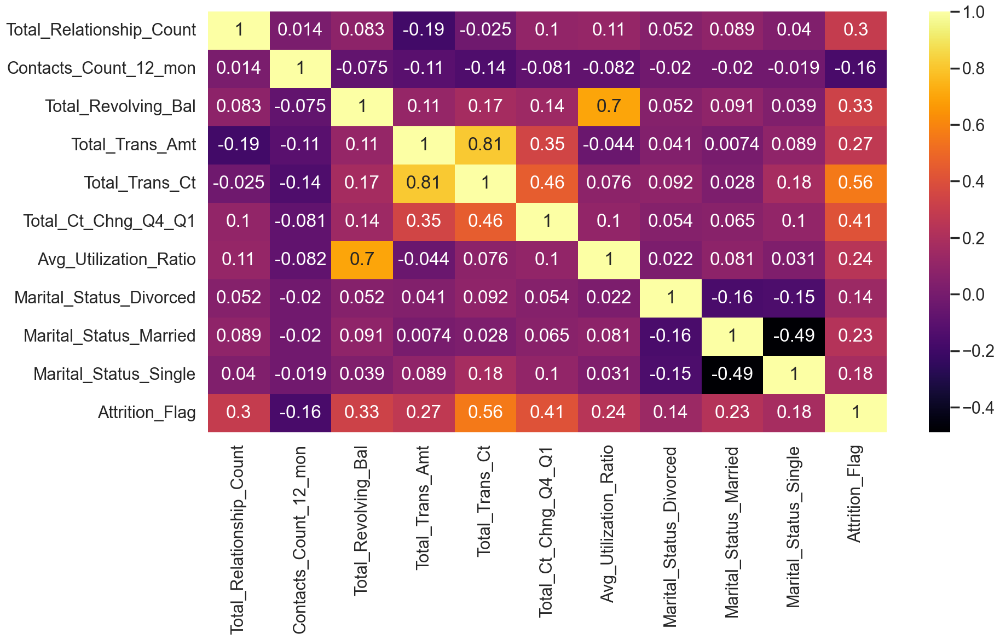

In [148]:
df_up_anova = pd.concat([df_up_anova, y_up], axis=1)
checkCorrFF(df_up_anova)

#### **Drop Feature**

In [149]:
df_up_anova.columns

Index(['Total_Relationship_Count', 'Contacts_Count_12_mon',
       'Total_Revolving_Bal', 'Total_Trans_Amt', 'Total_Trans_Ct',
       'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Marital_Status_Divorced', 'Marital_Status_Married',
       'Marital_Status_Single', 'Attrition_Flag'],
      dtype='object')

In [150]:
# df_up_anova.drop(['Avg_Utilization_Ratio','Total_Trans_Amt','Marital_Status_Single','Total_Amt_Chng_Q4_Q1'], axis=1, inplace=True)
df_up_anova.drop(['Avg_Utilization_Ratio','Total_Trans_Amt','Marital_Status_Single'], axis=1, inplace=True)

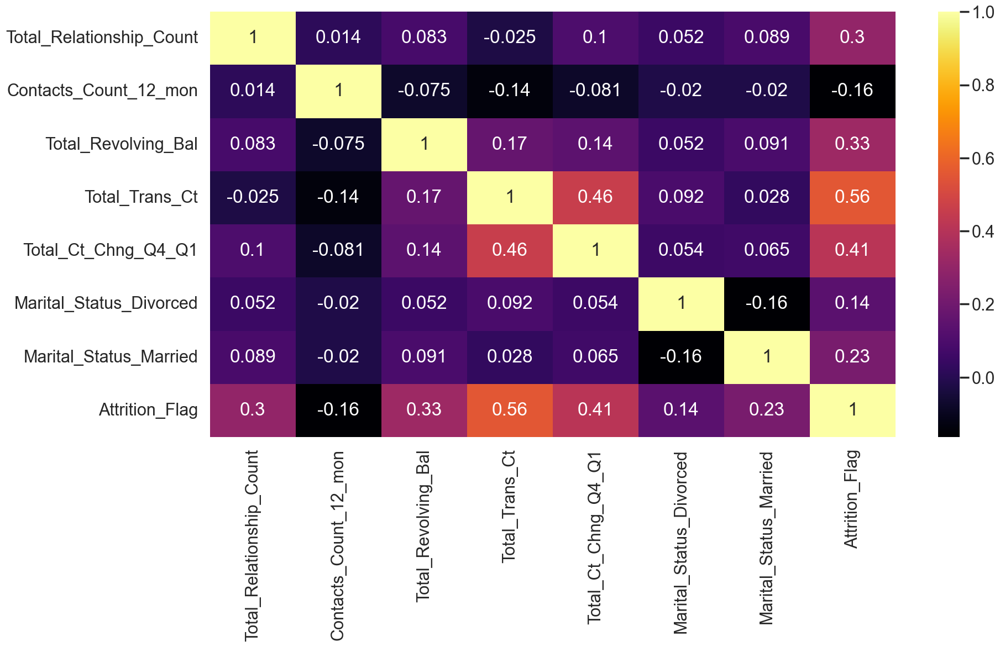

In [151]:
checkCorrFF(df_up_anova)

## **Model Training**

### **Repeated k-Fold Cross-Validation**

>f1 score 1 mean=0.843167 se=0.003132
>f1 score 2 mean=0.842624 se=0.001909
>f1 score 3 mean=0.842405 se=0.001620
>f1 score 4 mean=0.842503 se=0.001311
>f1 score 5 mean=0.842406 se=0.001394


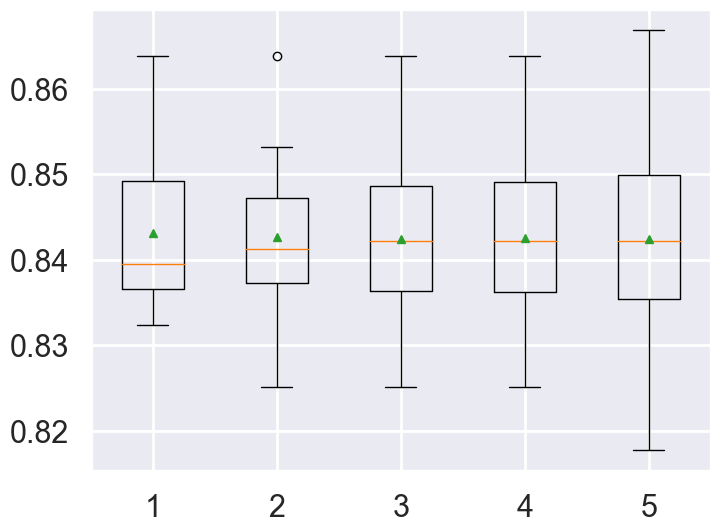

In [152]:
# create dataset
X_up_anova = df_up_anova.drop(['Attrition_Flag'], axis = 1)
y_up_anova = df_up_anova['Attrition_Flag']

_scoring = ['accuracy', 'precision', 'recall', 'f1']
# configurations to test
repeats = range(1,6)
results_up_anova = list()
for r in repeats:
	# evaluate using a given number of repeats
	scores_up_anova = evaluate_model(X_up_anova, y_up_anova, r,'f1')
	# summarize
	print('>f1 score %d mean=%.6f se=%.6f' % (r, np.mean(scores_up_anova), sem(scores_up_anova)))
	# store
	results_up_anova.append(scores_up_anova)
# plot the results
plt.boxplot(results_up_anova, labels=[str(r) for r in repeats], showmeans=True)
plt.show()

### **GridSearchCV**

In [153]:
#get the dummy variables for the categorical variables
x_up_anova = df_up_anova.drop(['Attrition_Flag'], axis = 1)
y_up_anova = df_up_anova['Attrition_Flag']

x_up_anova_train,x_up_anova_test,y_up_anova_train,y_up_anova_test = train_test_split(x_up_anova, y_up_anova, test_size = 0.2, random_state = 0)

grid={"C":np.logspace(-6,6,13),
      # "class_weight":[None,"balanced"],
      "penalty":['none', 'elasticnet', 'l1', 'l2'],
      "solver":['newton-cg','lbfgs','liblinear','sag','saga']}
logreg_up_anova=LogisticRegression()
logreg_cv_up_anova=GridSearchCV(logreg_up_anova
                       ,grid
                       ,cv=10
                       ,scoring='f1'
                       ,n_jobs=-1)
logreg_cv_up_anova.fit(x_up_anova_train,y_up_anova_train)

print("tuned hpyerparameters :(best parameters) ",logreg_cv_up_anova.best_params_)
print("f1 :",logreg_cv_up_anova.best_score_)

tuned hpyerparameters :(best parameters)  {'C': 1.0, 'penalty': 'l2', 'solver': 'liblinear'}
f1 : 0.8406446099712781


In [154]:
clf_up_anova = LogisticRegression(C=logreg_cv_up_anova.best_params_['C'], penalty=logreg_cv_up_anova.best_params_['penalty'], solver=logreg_cv_up_anova.best_params_['solver'])

clf_up_anova.fit(x_up_anova_train,y_up_anova_train)
print("model score: %.8f" % clf_up_anova.score(x_up_anova_test, y_up_anova_test))

model score: 0.85302687


### **Model Threshold**

(0.0, 1.0)

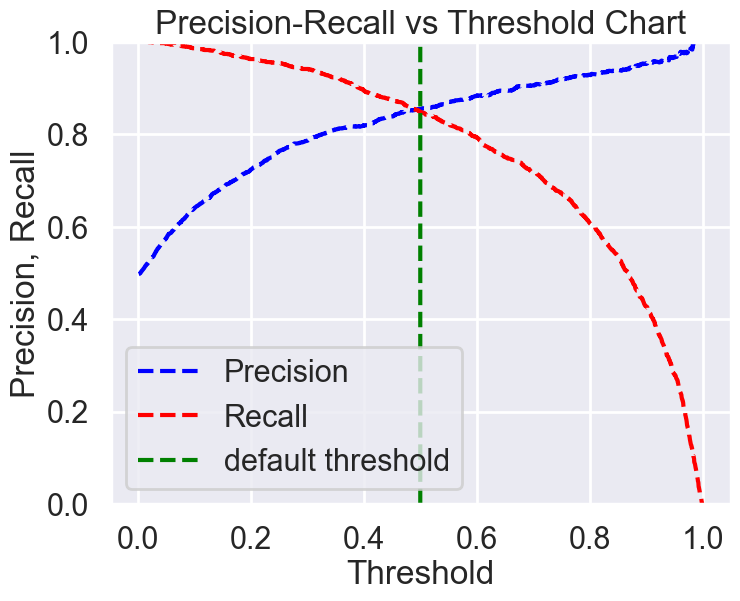

In [155]:
pred_y=clf_up_anova.predict(x_up_anova_test) 

probs_y=clf_up_anova.predict_proba(x_up_anova_test) 
  # probs_y is a 2-D array of probability of being labeled as 0 (first column of array) vs 1 (2nd column in array)

precision, recall, thresholds = precision_recall_curve(y_up_anova_test, probs_y[:, 1]) 
   #retrieve probability of being 1(in second column of probs_y)
pr_auc = metrics.auc(recall, precision)

plt.title("Precision-Recall vs Threshold Chart")
plt.plot(thresholds, precision[: -1], "b--", label="Precision")
plt.plot(thresholds, recall[: -1], "r--", label="Recall")
plt.plot(np.full(3252, 0.5),np.arange(0,1,1/3252), "g--", label="default threshold")
plt.ylabel("Precision, Recall")
plt.xlabel("Threshold")
plt.legend(loc="lower left")
plt.ylim([0,1])

### **Classification report**

In [156]:
# Classification report
y_up_anova_pred = clf_up_anova.predict(x_up_anova_train)
print("Classification report \n=======================")
print(classification_report(y_true=y_up_anova_train, y_pred=y_up_anova_pred))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_up_anova_train, y_pred=y_up_anova_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.85      0.84      0.84      6234
           1       0.84      0.84      0.84      6121

    accuracy                           0.84     12355
   macro avg       0.84      0.84      0.84     12355
weighted avg       0.84      0.84      0.84     12355

Confusion matrix 
[[5236  998]
 [ 954 5167]]


In [157]:
# Classification report
y_up_anova_pred = clf_up_anova.predict(x_up_anova_test)
print("Classification report \n=======================")
print(classification_report(y_true=y_up_anova_test, y_pred=y_up_anova_pred))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_up_anova_test, y_pred=y_up_anova_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.85      0.86      0.85      1553
           1       0.85      0.85      0.85      1536

    accuracy                           0.85      3089
   macro avg       0.85      0.85      0.85      3089
weighted avg       0.85      0.85      0.85      3089

Confusion matrix 
[[1332  221]
 [ 233 1303]]


# **Resampling Method 2** : Downsampling
<hr>

## **Data Preprocessing**
### **Resampling**

In [158]:
df_LE

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Avg_Utilization_Ratio,Gender,Education_Level,Income_Category,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Card_Category_NotBlue,Attrition_Flag
7511,47,3,36,6,1,2,3979.0,1319,2660.0,0.850,...,0.331,1,5,2,0,0,0,1,0,1
247,46,4,30,3,3,3,2442.0,0,2442.0,0.980,...,0.000,0,2,5,0,1,0,0,0,0
713,57,2,45,4,2,0,2494.0,1639,855.0,0.858,...,0.657,1,0,1,0,1,0,0,0,1
4527,48,2,42,6,3,2,2760.0,0,2760.0,0.576,...,0.000,0,6,2,0,0,1,0,0,0
6866,41,5,22,6,2,2,1438.3,0,1438.3,0.560,...,0.000,0,2,2,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9225,30,0,20,1,3,3,23760.0,1349,22411.0,0.961,...,0.057,0,0,3,0,0,1,0,0,1
4859,50,2,43,4,3,3,4388.0,642,3746.0,0.815,...,0.146,0,1,3,0,0,1,0,0,1
3264,60,1,50,4,3,0,10698.0,1790,8908.0,0.981,...,0.167,0,0,3,0,0,1,0,0,1
9845,51,3,40,3,3,2,34516.0,1476,33040.0,0.763,...,0.043,0,3,5,0,1,0,0,0,1


In [159]:
df_LE['Attrition_Flag'].value_counts()

1    8070
0    1550
Name: Attrition_Flag, dtype: int64

In [160]:
maxcount = df_LE['Attrition_Flag'].value_counts()[0]/2
df_dwsampled = df_LE[0:0]
for grp in df_LE['Attrition_Flag'].unique():
    GrpDF = df_LE[df_LE['Attrition_Flag'] == grp]
    resampled = resample(GrpDF, replace=True, n_samples=int(maxcount), random_state=123)
    df_dwsampled = df_dwsampled.append(resampled)

1    775
0    775
Name: Attrition_Flag, dtype: int64


<AxesSubplot:ylabel='Type'>

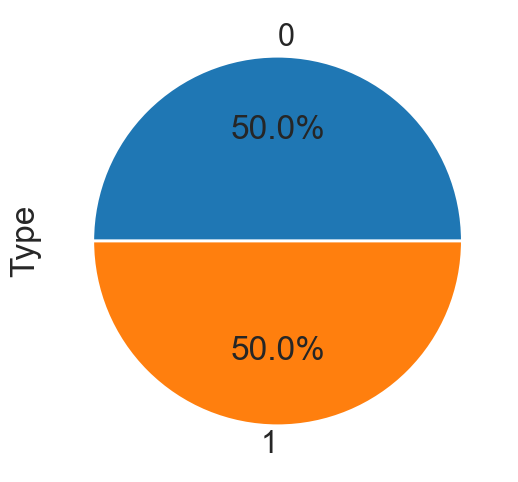

In [161]:
print(df_dwsampled["Attrition_Flag"].value_counts())

df_dwsampled.groupby('Attrition_Flag').size().plot(kind='pie',
                                                y = "Attrition_Flag",
                                                label = "Type",
                                                autopct='%1.1f%%')

In [162]:
df_dwsampled.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Avg_Utilization_Ratio,Gender,Education_Level,Income_Category,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Card_Category_NotBlue,Attrition_Flag
count,1550.000000,1550.000000,1550.000000,1550.000000,1550.000000,1550.000000,1550.000000,1550.000000,1550.000000,1550.000000,...,1550.000000,1550.000000,1550.000000,1550.000000,1550.000000,1550.000000,1550.000000,1550.000000,1550.000000,1550.000000
mean,46.641290,2.332258,36.166452,3.650323,2.480645,2.632258,8729.140000,973.878710,7755.261290,0.733614,...,0.226703,0.532903,2.576774,2.115484,0.079355,0.440645,0.398065,0.081935,0.074839,0.500000
std,8.183284,1.282521,7.842669,1.591714,0.963812,1.156671,9446.732019,882.578196,9449.219743,0.220918,...,0.271634,0.499077,1.724461,1.501952,0.270379,0.496625,0.489657,0.274355,0.263216,0.500161
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,14.000000,0.046000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,41.000000,1.000000,32.000000,2.000000,2.000000,2.000000,2403.500000,0.000000,1438.300000,0.602000,...,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,47.000000,2.000000,36.000000,4.000000,3.000000,3.000000,4463.500000,971.000000,3557.000000,0.719000,...,0.099500,1.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000
75%,52.750000,3.000000,41.000000,5.000000,3.000000,3.000000,11278.750000,1694.750000,10023.750000,0.855000,...,0.410750,1.000000,4.000000,3.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,2.316000,...,0.992000,1.000000,6.000000,5.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [163]:
df.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Attrition_Flag
count,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894,0.839340
std,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691,0.367235
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000,0.000000
25%,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000,1.000000
50%,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000,1.000000
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000,1.000000
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000,1.000000


### **Data Transformation**

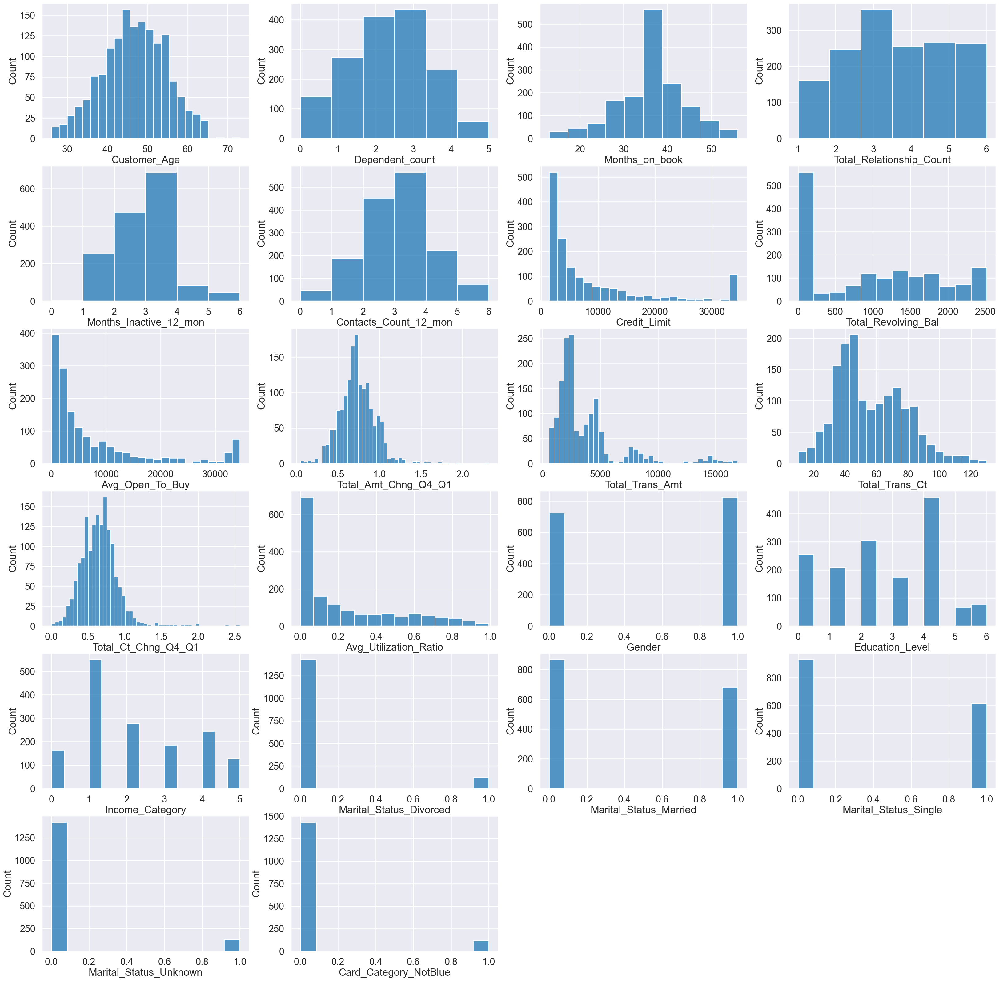

In [164]:
# plot numerical data
plt.figure(figsize=(40,40))

for idx, col in enumerate(df_dwsampled.columns):
    if col not in ['Attrition_Flag']:
        plt.subplot(6,4,idx+1)
        if col in ['Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon']:
            sns.histplot(df_dwsampled[col],bins=6)
        elif col in ['Months_on_book']:
            sns.histplot(df_dwsampled[col],bins=10)
        else:
            sns.histplot(df_dwsampled[col])

In [165]:
df_dwsampled.columns

Index(['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Gender', 'Education_Level', 'Income_Category',
       'Marital_Status_Divorced', 'Marital_Status_Married',
       'Marital_Status_Single', 'Marital_Status_Unknown',
       'Card_Category_NotBlue', 'Attrition_Flag'],
      dtype='object')

In [166]:
log_var = ['Credit_Limit','Avg_Open_To_Buy',
           'Total_Amt_Chng_Q4_Q1','Total_Ct_Chng_Q4_Q1']

for idx,col in enumerate(log_var):
    df_dwsampled[col] = np.log10(df_dwsampled[col]+1)

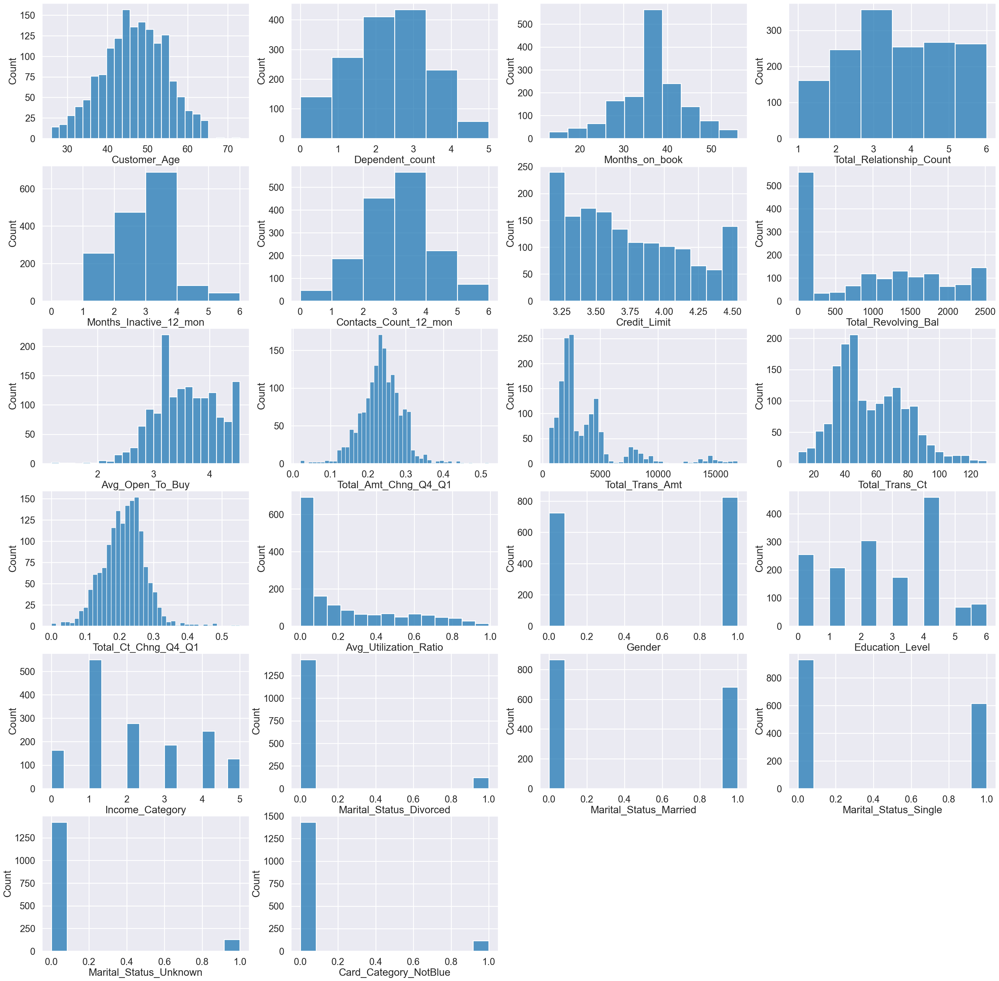

In [167]:
# plot numerical data
plt.figure(figsize=(40,40))

for idx, col in enumerate(df_dwsampled.columns):
    if col not in ['Attrition_Flag']:
        plt.subplot(6,4,idx+1)
        if col in ['Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon']:
            sns.histplot(df_dwsampled[col],bins=6)
        elif col in ['Months_on_book']:
            sns.histplot(df_dwsampled[col],bins=10)
        else:
            sns.histplot(df_dwsampled[col])

### **Clear outlier**

In [168]:
# df_upsampled.boxplot(column=[str(i) for count, i in enumerate(df_upsampled.columns) if i != 'Attrition_Flag' and count < 10], figsize=(50,10), grid=False)

#### **Strip Plot**

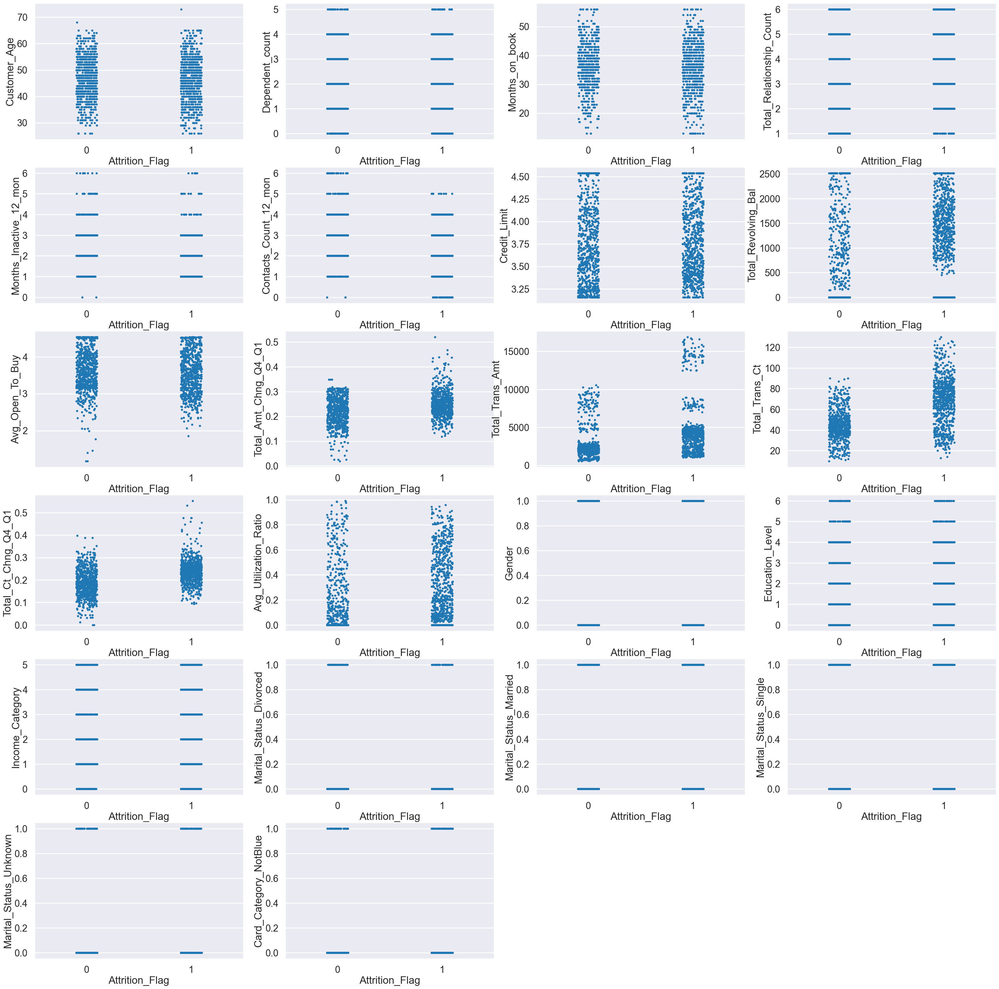

In [169]:
plt.figure(figsize=(40,40))
for idx, col in enumerate(df_dwsampled.columns):
    if col not in ["Attrition_Flag"]:
        plt.subplot(6,4,idx+1)
        sns.stripplot(x="Attrition_Flag", y=col, data=df_dwsampled)

#### **Remove Outliers**

In [170]:
df_dwsampled.columns

Index(['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Gender', 'Education_Level', 'Income_Category',
       'Marital_Status_Divorced', 'Marital_Status_Married',
       'Marital_Status_Single', 'Marital_Status_Unknown',
       'Card_Category_NotBlue', 'Attrition_Flag'],
      dtype='object')

In [171]:
print('Before remove outlier, the shape of df_dwsampled: {}'.format(df_dwsampled.shape))

df_dwsampled = df_dwsampled.drop(df_dwsampled[df_dwsampled['Avg_Open_To_Buy'] <= 2.0].index & df_dwsampled[df_dwsampled['Attrition_Flag'] == 0].index)
df_dwsampled = df_dwsampled.drop(df_dwsampled[df_dwsampled['Avg_Open_To_Buy'] <= 2.0].index & df_dwsampled[df_dwsampled['Attrition_Flag'] == 1].index)
print('df_dwsampled.shape after remove outlier Avg_Open_To_Buy : {}'.format(df_dwsampled.shape))

df_dwsampled = IQRdrop(df_dwsampled, 'Total_Amt_Chng_Q4_Q1')
# df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Amt_Chng_Q4_Q1'] >= 0.38].index & df_upsampled[df_upsampled['Attrition_Flag'] == 0].index)
# df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Amt_Chng_Q4_Q1'] >= 0.5].index & df_upsampled[df_upsampled['Attrition_Flag'] == 1].index)
# print('df_upsampled.shape after remove outlier Total_Amt_Chng_Q4_Q1 : {}'.format(df_upsampled.shape))

# df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Trans_Amt'] >= 16000].index & df_upsampled[df_upsampled['Attrition_Flag'] == 1].index)
# print('df_upsampled.shape after remove outlier Total_Trans_Amt : {}'.format(df_upsampled.shape))

# df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Trans_Ct'] >= 127].index & df_upsampled[df_upsampled['Attrition_Flag'] == 1].index)
print('df_dwsampled.shape after remove outlier Total_Trans_Amt : {}'.format(df_dwsampled.shape))


df_dwsampled = IQRdrop(df_dwsampled, 'Total_Ct_Chng_Q4_Q1')
# df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Ct_Chng_Q4_Q1'] >= 0.5].index & df_upsampled[df_upsampled['Attrition_Flag'] == 0].index)
# df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Ct_Chng_Q4_Q1'] <= 0.0].index & df_upsampled[df_upsampled['Attrition_Flag'] == 0].index)
# print('df_upsampled.shape after remove outlier Total_Ct_Chng_Q4_Q1 : {}'.format(df_upsampled.shape))

# df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Ct_Chng_Q4_Q1'] >= 0.55].index & df_upsampled[df_upsampled['Attrition_Flag'] == 1].index)
# df_upsampled = df_upsampled.drop(df_upsampled[df_upsampled['Total_Ct_Chng_Q4_Q1'] <= 0.05].index & df_upsampled[df_upsampled['Attrition_Flag'] == 1].index)
print('df_dwsampled.shape after remove outlier Total_Ct_Chng_Q4_Q1 : {}'.format(df_dwsampled.shape))

df_dwsampled = IQRdrop(df_dwsampled, 'Customer_Age')
print('df_dwsampled.shape after remove outlier Customer_Age : {}'.format(df_dwsampled.shape))

Before remove outlier, the shape of df_dwsampled: (1550, 23)
df_dwsampled.shape after remove outlier Avg_Open_To_Buy : (1543, 23)
df_dwsampled.shape after remove outlier Total_Trans_Amt : (1504, 23)
df_dwsampled.shape after remove outlier Total_Ct_Chng_Q4_Q1 : (1483, 23)
df_dwsampled.shape after remove outlier Customer_Age : (1483, 23)


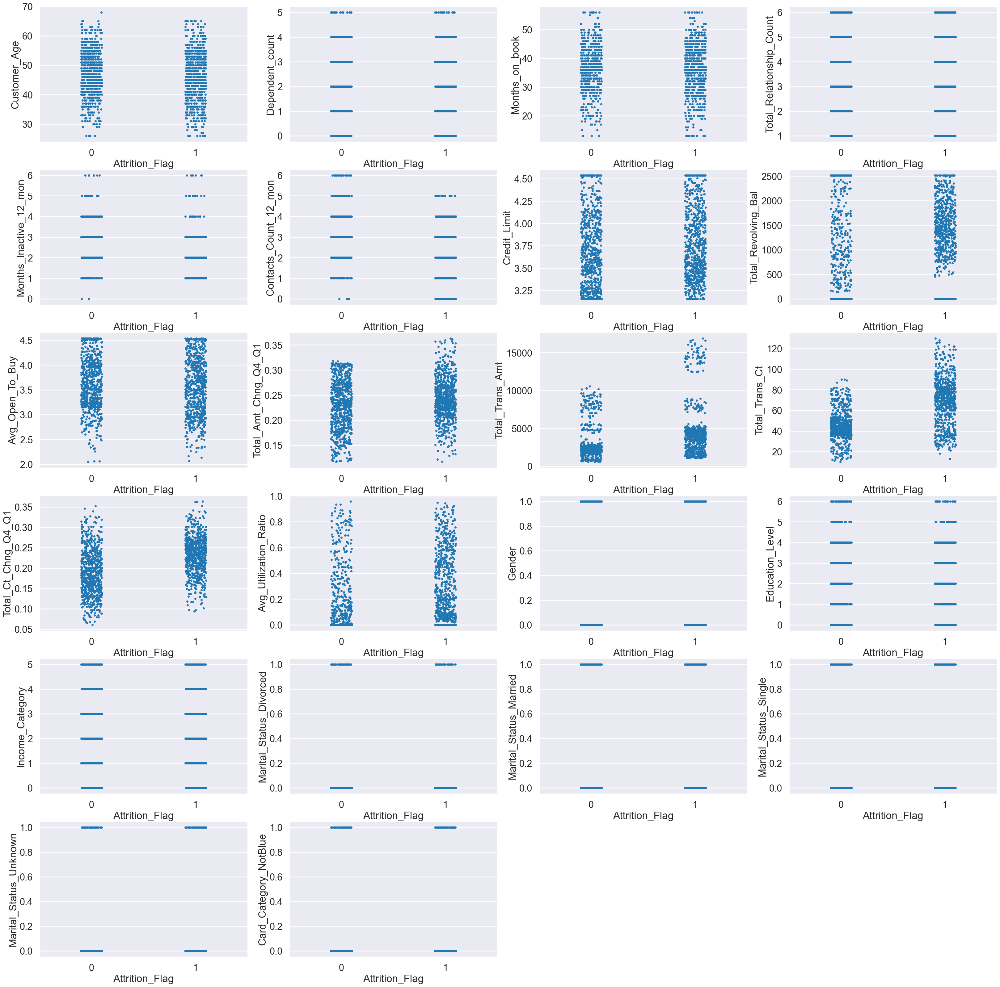

In [172]:
plt.figure(figsize=(40,40))
for idx, col in enumerate(df_dwsampled.columns):
    if col not in ["Attrition_Flag"]:
        plt.subplot(6,4,idx+1)
        sns.stripplot(x="Attrition_Flag", y=col, data=df_dwsampled)

### **Feature Scaling (Numerical)**

In [173]:
robust_scaler = RobustScaler()
min_max_scaler = MinMaxScaler()

for idx in df_dwsampled.columns:
    if idx not in ['Attrition_Flag']:
        df_dwsampled[idx]=min_max_scaler.fit_transform(df_dwsampled[idx].values.reshape(-1,1))

In [174]:
df_dwsampled.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Avg_Utilization_Ratio,Gender,Education_Level,Income_Category,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Card_Category_NotBlue,Attrition_Flag
count,1483.000000,1483.000000,1483.000000,1483.000000,1483.000000,1483.000000,1483.000000,1483.000000,1483.000000,1483.000000,...,1483.000000,1483.000000,1483.000000,1483.000000,1483.000000,1483.000000,1483.000000,1483.000000,1483.000000,1483.000000
mean,0.490672,0.467296,0.538663,0.529332,0.412452,0.438413,0.418111,0.385314,0.615738,0.479113,...,0.232791,0.532030,0.427512,0.424275,0.082266,0.434255,0.403237,0.080243,0.076197,0.501011
std,0.193271,0.256894,0.182177,0.321470,0.161283,0.193009,0.301940,0.351128,0.220645,0.189941,...,0.279767,0.499141,0.288236,0.301062,0.274862,0.495826,0.490713,0.271760,0.265402,0.500168
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.357143,0.200000,0.441860,0.200000,0.333333,0.333333,0.164577,0.000000,0.448357,0.358368,...,0.000000,0.000000,0.166667,0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.500000,0.400000,0.534884,0.600000,0.500000,0.500000,0.362248,0.383790,0.608045,0.479437,...,0.100209,1.000000,0.500000,0.400000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,0.619048,0.600000,0.651163,0.800000,0.500000,0.500000,0.648651,0.672229,0.786381,0.612346,...,0.420668,1.000000,0.666667,0.600000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [175]:
df_dwsampled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1483 entries, 3815 to 9457
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Customer_Age              1483 non-null   float64
 1   Dependent_count           1483 non-null   float64
 2   Months_on_book            1483 non-null   float64
 3   Total_Relationship_Count  1483 non-null   float64
 4   Months_Inactive_12_mon    1483 non-null   float64
 5   Contacts_Count_12_mon     1483 non-null   float64
 6   Credit_Limit              1483 non-null   float64
 7   Total_Revolving_Bal       1483 non-null   float64
 8   Avg_Open_To_Buy           1483 non-null   float64
 9   Total_Amt_Chng_Q4_Q1      1483 non-null   float64
 10  Total_Trans_Amt           1483 non-null   float64
 11  Total_Trans_Ct            1483 non-null   float64
 12  Total_Ct_Chng_Q4_Q1       1483 non-null   float64
 13  Avg_Utilization_Ratio     1483 non-null   float64
 14  Gende

### **Feature Selection**

In [176]:
selector_dw_anova = SelectKBest(f_classif, k=10)
x_dw = df_dwsampled.drop(['Attrition_Flag'], axis = 1)
y_dw = df_dwsampled['Attrition_Flag']

df_dw_anova = selector_dw_anova.fit(x_dw, y_dw)

col_dw_anova = selector_dw_anova.get_support(indices=True)
df_dw_anova = x_dw.iloc[:,col_dw_anova]

#### **Concatenate Data**

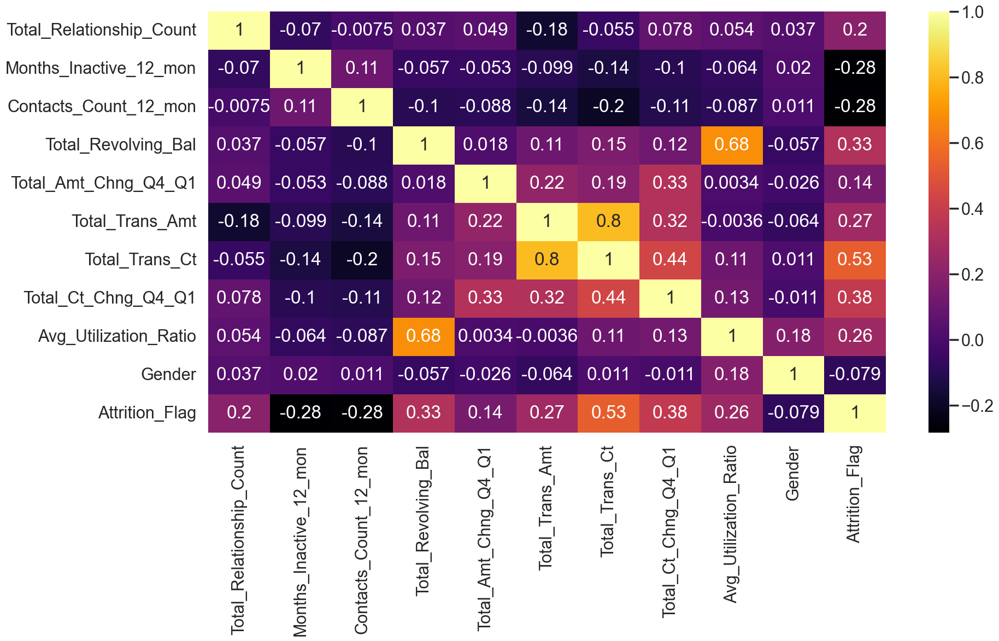

In [177]:
df_dw_anova = pd.concat([df_dw_anova, y_dw], axis=1)
checkCorrFF(df_dw_anova)

In [178]:
df_dw_anova.columns

Index(['Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Total_Revolving_Bal', 'Total_Amt_Chng_Q4_Q1',
       'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1',
       'Avg_Utilization_Ratio', 'Gender', 'Attrition_Flag'],
      dtype='object')

In [180]:
# df_dw_anova.drop(['Avg_Utilization_Ratio','Total_Trans_Amt','Marital_Status_Married'], axis=1, inplace=True)
df_dw_anova.drop(['Avg_Utilization_Ratio','Total_Trans_Amt','Gender'], axis=1, inplace=True)

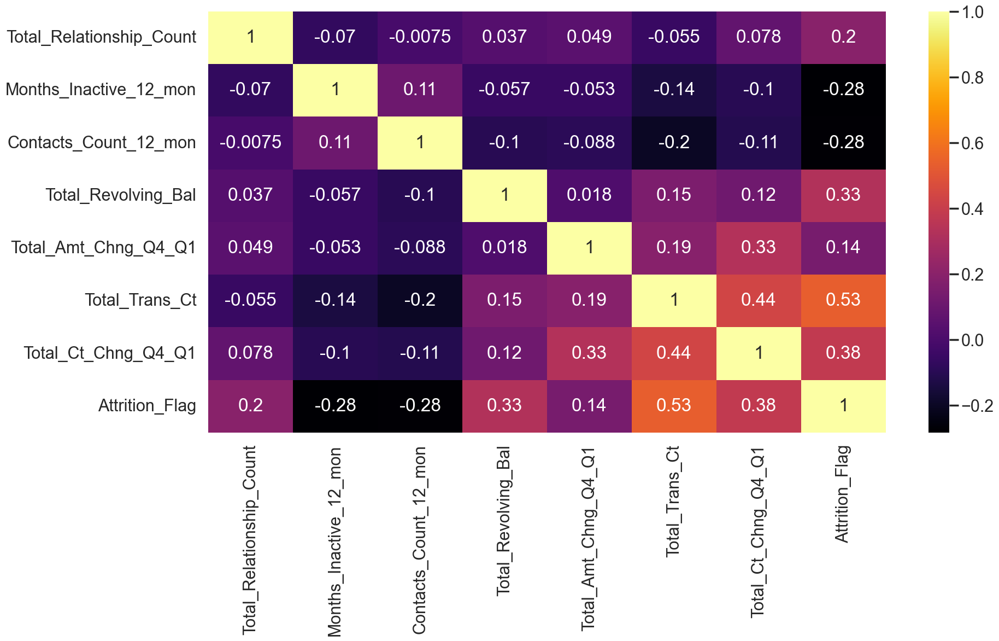

In [181]:
checkCorrFF(df_dw_anova)

## **Model Training**

### **Repeated k-Fold Cross-Validation**

>f1 score 1 mean=0.8266 se=0.007
>f1 score 2 mean=0.8272 se=0.007
>f1 score 3 mean=0.8273 se=0.006
>f1 score 4 mean=0.8267 se=0.005
>f1 score 5 mean=0.8262 se=0.004


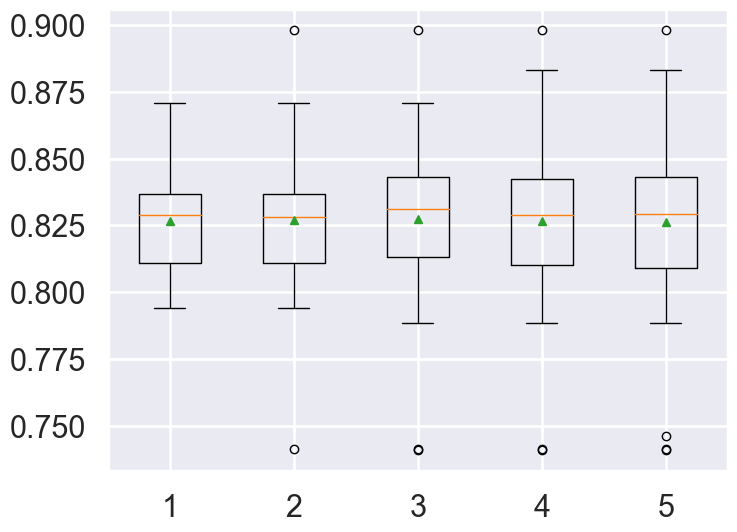

In [182]:
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import cross_val_score
from scipy.stats import sem

# evaluate a model with a given number of repeats
def evaluate_model(X, y, repeats,scores):
	# prepare the cross-validation procedure
	cv = RepeatedKFold(n_splits=10, n_repeats=repeats, random_state=1)
	# create model
	model = LogisticRegression()
	# evaluate model
	scores = cross_val_score(model, X, y, scoring=scores, cv=cv, n_jobs=-1)
	return scores

# create dataset
X_dw_anova = df_dw_anova.drop(['Attrition_Flag'], axis = 1)
y_dw_anova = df_dw_anova['Attrition_Flag']

_scoring = ['accuracy', 'precision', 'recall', 'f1']
# configurations to test
repeats = range(1,6)
results_dw_anova = list()
for r in repeats:
	# evaluate using a given number of repeats
	scores_dw_anova = evaluate_model(X_dw_anova, y_dw_anova, r,'f1')
	# summarize
	print('>f1 score %d mean=%.4f se=%.3f' % (r, np.mean(scores_dw_anova), sem(scores_dw_anova)))
	# store
	results_dw_anova.append(scores_dw_anova)
# plot the results
plt.boxplot(results_dw_anova, labels=[str(r) for r in repeats], showmeans=True)
plt.show()

### **GridSearchCV**

In [183]:
from sklearn.model_selection import GridSearchCV

#get the dummy variables for the categorical variables
x_dw_anova = df_dw_anova.drop(['Attrition_Flag'], axis = 1)
y_dw_anova = df_dw_anova['Attrition_Flag']

x_dw_anova_train,x_dw_anova_test,y_dw_anova_train,y_dw_anova_test = train_test_split(x_dw_anova, y_dw_anova, test_size = 0.2, random_state = 0)

grid={"C":np.logspace(-6,6,13),
      # "class_weight":[None,"balanced"],
      "penalty":['none', 'elasticnet', 'l1', 'l2'],
      "solver":['newton-cg','lbfgs','liblinear','sag','saga']}
logreg_dw_anova=LogisticRegression()
logreg_cv_dw_anova=GridSearchCV(logreg_dw_anova
                              ,grid
                              ,cv=10
                              ,scoring='f1'
                              ,n_jobs=-1)
logreg_cv_dw_anova.fit(x_dw_anova_train,y_dw_anova_train)

print("tuned hpyerparameters :(best parameters) ",logreg_cv_dw_anova.best_params_)
print("f1 :",logreg_cv_dw_anova.best_score_)

tuned hpyerparameters :(best parameters)  {'C': 1.0, 'penalty': 'l1', 'solver': 'liblinear'}
f1 : 0.8263610886574565


In [184]:
clf_dw_anova = LogisticRegression(C=logreg_cv_dw_anova.best_params_['C']
                                  , penalty=logreg_cv_dw_anova.best_params_['penalty']
                                  , solver=logreg_cv_dw_anova.best_params_['solver'])

clf_dw_anova.fit(x_dw_anova_train,y_dw_anova_train)
print("model score: %.8f" % clf_dw_anova.score(x_dw_anova_test, y_dw_anova_test))

model score: 0.83838384


### **Model Threshold**

(0.0, 1.0)

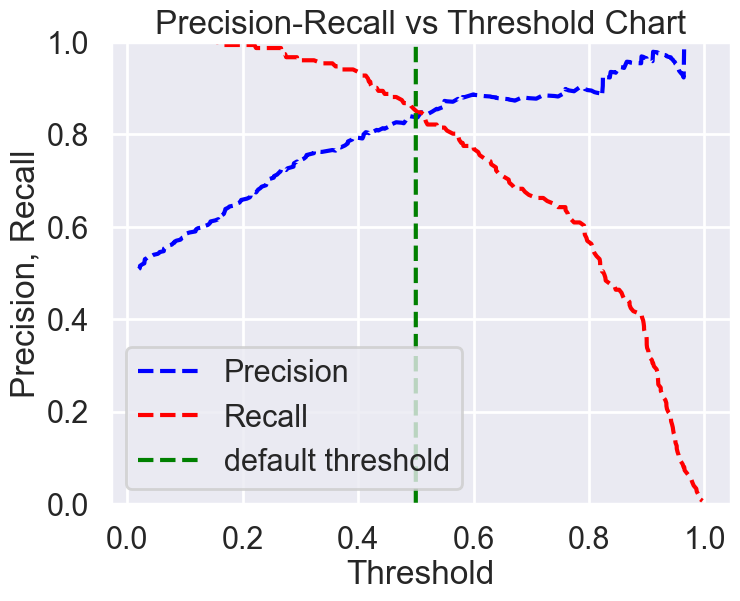

In [185]:
pred_y=clf_dw_anova.predict(x_dw_anova_test) 

probs_y=clf_dw_anova.predict_proba(x_dw_anova_test) 
  # probs_y is a 2-D array of probability of being labeled as 0 (first column of array) vs 1 (2nd column in array)

precision, recall, thresholds = precision_recall_curve(y_dw_anova_test, probs_y[:, 1]) 
   #retrieve probability of being 1(in second column of probs_y)
pr_auc = metrics.auc(recall, precision)

plt.title("Precision-Recall vs Threshold Chart")
plt.plot(thresholds, precision[: -1], "b--", label="Precision")
plt.plot(thresholds, recall[: -1], "r--", label="Recall")
plt.plot(np.full(3252, 0.5),np.arange(0,1,1/3252), "g--", label="default threshold")
plt.ylabel("Precision, Recall")
plt.xlabel("Threshold")
plt.legend(loc="lower left")
plt.ylim([0,1])

### **Classification report**

In [186]:
# Classification report
y_dw_anova_pred = clf_dw_anova.predict(x_dw_anova_train)
print("Classification report \n=======================")
print(classification_report(y_true=y_dw_anova_train, y_pred=y_dw_anova_pred))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_dw_anova_train, y_pred=y_dw_anova_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.82      0.85      0.83       594
           1       0.84      0.81      0.83       592

    accuracy                           0.83      1186
   macro avg       0.83      0.83      0.83      1186
weighted avg       0.83      0.83      0.83      1186

Confusion matrix 
[[504  90]
 [112 480]]


In [187]:
# Classification report
y_dw_anova_pred = clf_dw_anova.predict(x_dw_anova_test)
print("Classification report \n=======================")
print(classification_report(y_true=y_dw_anova_test, y_pred=y_dw_anova_pred))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_dw_anova_test, y_pred=y_dw_anova_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.84      0.83      0.83       146
           1       0.84      0.85      0.84       151

    accuracy                           0.84       297
   macro avg       0.84      0.84      0.84       297
weighted avg       0.84      0.84      0.84       297

Confusion matrix 
[[121  25]
 [ 23 128]]


# **Resampling Method 3** : Tomek Links
<hr>

## **Data Preprocessing**

### **Resampling**

In [188]:
df_LE

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Avg_Utilization_Ratio,Gender,Education_Level,Income_Category,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Card_Category_NotBlue,Attrition_Flag
7511,47,3,36,6,1,2,3979.0,1319,2660.0,0.850,...,0.331,1,5,2,0,0,0,1,0,1
247,46,4,30,3,3,3,2442.0,0,2442.0,0.980,...,0.000,0,2,5,0,1,0,0,0,0
713,57,2,45,4,2,0,2494.0,1639,855.0,0.858,...,0.657,1,0,1,0,1,0,0,0,1
4527,48,2,42,6,3,2,2760.0,0,2760.0,0.576,...,0.000,0,6,2,0,0,1,0,0,0
6866,41,5,22,6,2,2,1438.3,0,1438.3,0.560,...,0.000,0,2,2,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9225,30,0,20,1,3,3,23760.0,1349,22411.0,0.961,...,0.057,0,0,3,0,0,1,0,0,1
4859,50,2,43,4,3,3,4388.0,642,3746.0,0.815,...,0.146,0,1,3,0,0,1,0,0,1
3264,60,1,50,4,3,0,10698.0,1790,8908.0,0.981,...,0.167,0,0,3,0,0,1,0,0,1
9845,51,3,40,3,3,2,34516.0,1476,33040.0,0.763,...,0.043,0,3,5,0,1,0,0,0,1


<AxesSubplot:ylabel='Type'>

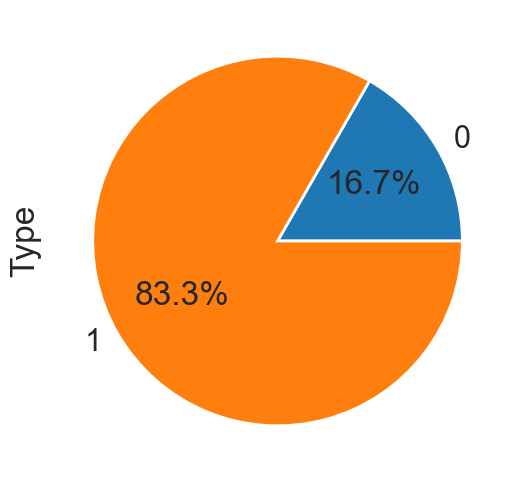

In [189]:
undersample = TomekLinks()

# transform the dataset
dfX = df_LE.drop(['Attrition_Flag'], axis=1)
dfY = df_LE['Attrition_Flag']
X, y = undersample.fit_resample(dfX, dfY)
dfTomek = pd.concat([X, y], axis=1)

dfTomek.groupby('Attrition_Flag').size().plot(kind='pie',
                                        y = "Attrition_Flag",
                                        label = "Type",
                                        autopct='%1.1f%%')

1    7729
0    1550
Name: Attrition_Flag, dtype: int64


<AxesSubplot:ylabel='Type'>

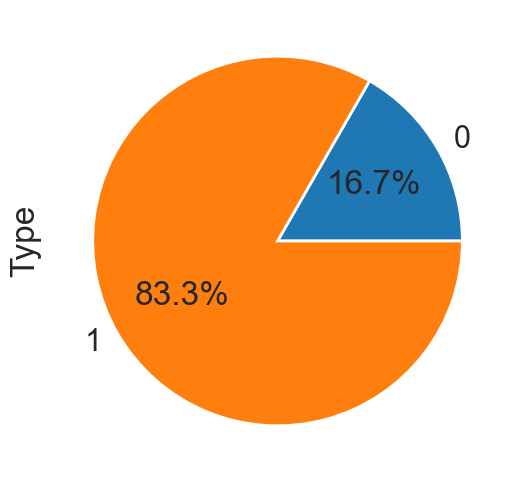

In [190]:
print(dfTomek["Attrition_Flag"].value_counts())

dfTomek.groupby('Attrition_Flag').size().plot(kind='pie',
                                       y = "Attrition_Flag",
                                       label = "Type",
                                       autopct='%1.1f%%')

In [191]:
dfTomek.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Avg_Utilization_Ratio,Gender,Education_Level,Income_Category,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Card_Category_NotBlue,Attrition_Flag
count,9279.000000,9279.000000,9279.000000,9279.000000,9279.000000,9279.000000,9279.000000,9279.000000,9279.000000,9279.000000,...,9279.000000,9279.000000,9279.000000,9279.000000,9279.000000,9279.000000,9279.000000,9279.000000,9279.000000,9279.000000
mean,46.433775,2.356073,35.997737,3.792003,2.343248,2.447678,8579.870988,1172.301864,7407.569124,0.757088,...,0.276823,0.532600,2.600496,2.079534,0.074577,0.462550,0.388188,0.074685,0.066818,0.832956
std,7.940058,1.296418,7.929136,1.557705,1.009320,1.107907,9030.765965,809.487247,9025.220983,0.215322,...,0.275276,0.498963,1.703060,1.471996,0.262722,0.498622,0.487364,0.262896,0.249719,0.373035
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,10.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,41.000000,1.000000,32.000000,3.000000,2.000000,2.000000,2549.000000,497.500000,1312.000000,0.630000,...,0.029000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4535.000000,1289.000000,3432.000000,0.736000,...,0.179000,1.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,10973.500000,1785.500000,9792.000000,0.857000,...,0.506000,1.000000,4.000000,3.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,...,0.995000,1.000000,6.000000,5.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [192]:
df.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Attrition_Flag
count,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894,0.839340
std,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691,0.367235
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000,0.000000
25%,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000,1.000000
50%,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000,1.000000
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000,1.000000
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000,1.000000


### **Feature Scaling (Numerical)**

In [193]:
min_max_scaler = MinMaxScaler()

for idx in dfTomek.columns:
    if idx not in ['Attrition_Flag']:
        dfTomek[idx]=min_max_scaler.fit_transform(dfTomek[idx].values.reshape(-1,1))

In [194]:
dfTomek.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,...,Avg_Utilization_Ratio,Gender,Education_Level,Income_Category,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Card_Category_NotBlue,Attrition_Flag
count,9279.000000,9279.000000,9279.000000,9279.000000,9279.000000,9279.000000,9279.000000,9279.000000,9279.000000,9279.000000,...,9279.000000,9279.000000,9279.000000,9279.000000,9279.000000,9279.000000,9279.000000,9279.000000,9279.000000,9279.000000
mean,0.434761,0.471215,0.534831,0.558401,0.390541,0.407946,0.215903,0.465754,0.214385,0.222870,...,0.278214,0.532600,0.433416,0.415907,0.074577,0.462550,0.388188,0.074685,0.066818,0.832956
std,0.168937,0.259284,0.184399,0.311541,0.168220,0.184651,0.273017,0.321608,0.261555,0.063386,...,0.276659,0.498963,0.283843,0.294399,0.262722,0.498622,0.487364,0.262896,0.249719,0.373035
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.319149,0.200000,0.441860,0.400000,0.333333,0.333333,0.033579,0.197656,0.037733,0.185458,...,0.029146,0.000000,0.166667,0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,0.425532,0.400000,0.534884,0.600000,0.333333,0.333333,0.093619,0.512118,0.099171,0.216662,...,0.179899,1.000000,0.500000,0.400000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,0.553191,0.600000,0.627907,0.800000,0.500000,0.500000,0.288267,0.709376,0.283487,0.252281,...,0.508543,1.000000,0.666667,0.600000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [195]:
dfTomek.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9279 entries, 0 to 9278
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Customer_Age              9279 non-null   float64
 1   Dependent_count           9279 non-null   float64
 2   Months_on_book            9279 non-null   float64
 3   Total_Relationship_Count  9279 non-null   float64
 4   Months_Inactive_12_mon    9279 non-null   float64
 5   Contacts_Count_12_mon     9279 non-null   float64
 6   Credit_Limit              9279 non-null   float64
 7   Total_Revolving_Bal       9279 non-null   float64
 8   Avg_Open_To_Buy           9279 non-null   float64
 9   Total_Amt_Chng_Q4_Q1      9279 non-null   float64
 10  Total_Trans_Amt           9279 non-null   float64
 11  Total_Trans_Ct            9279 non-null   float64
 12  Total_Ct_Chng_Q4_Q1       9279 non-null   float64
 13  Avg_Utilization_Ratio     9279 non-null   float64
 14  Gender  

### **Clear outlier**

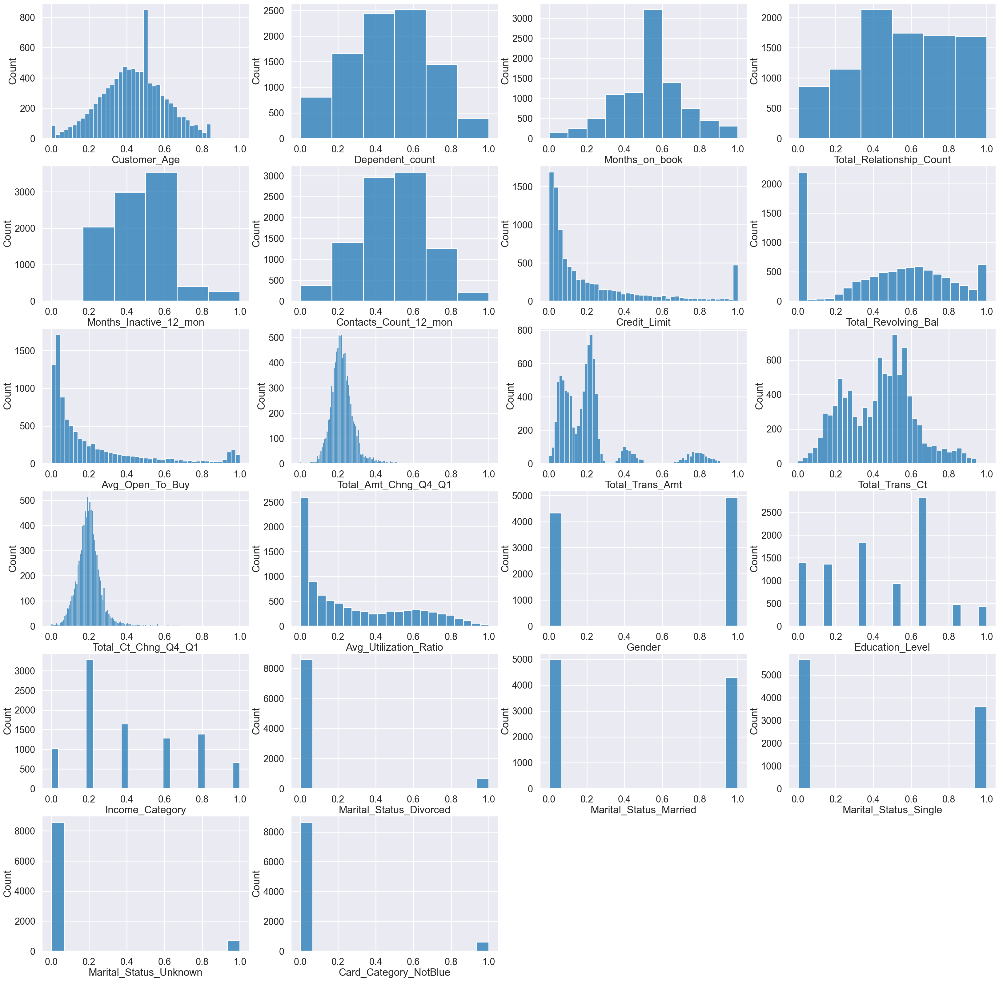

In [196]:
# plot numerical data
plt.figure(figsize=(40,40))

for idx, col in enumerate(dfTomek.columns):
    if col not in ['Attrition_Flag']:
        plt.subplot(6,4,idx+1)
        if col in ['Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon']:
            sns.histplot(dfTomek[col],bins=6)
        elif col in ['Months_on_book']:
            sns.histplot(dfTomek[col],bins=10)
        else:
            sns.histplot(dfTomek[col])

**Strip Plot**

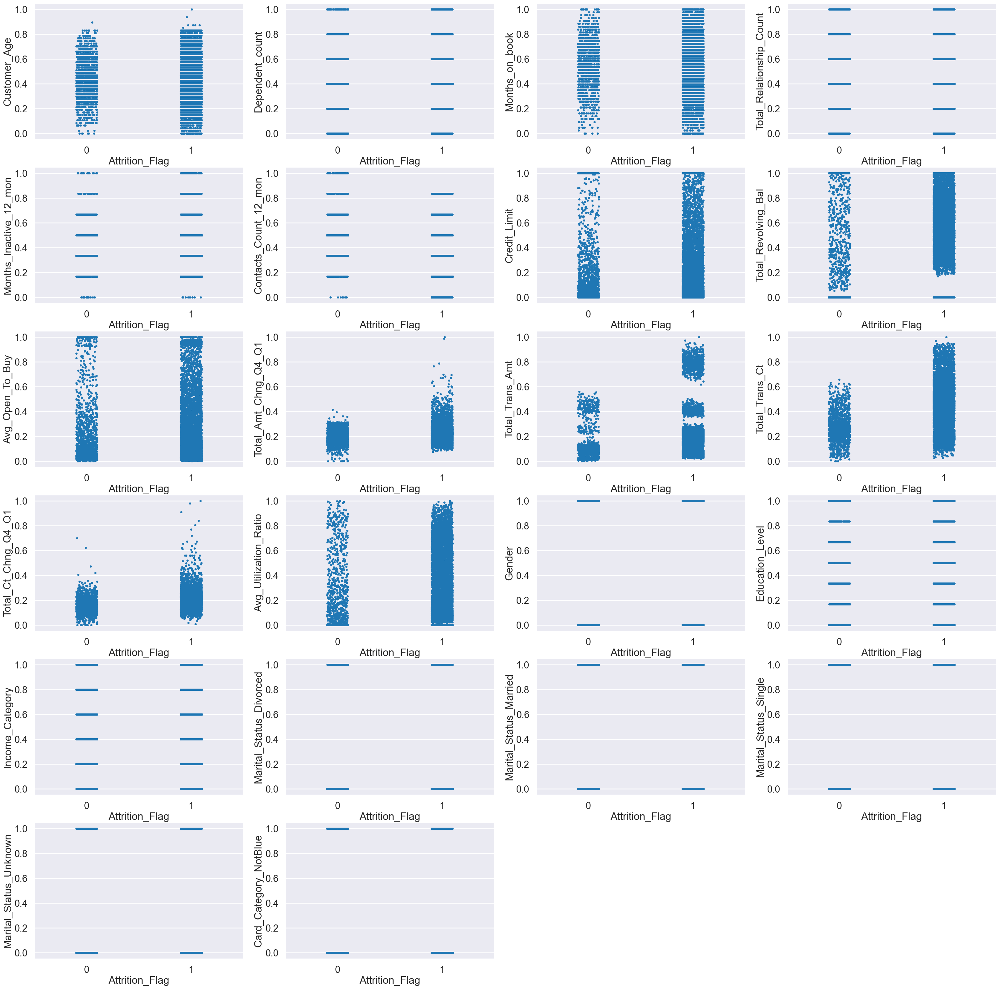

In [197]:
plt.figure(figsize=(40,40))
for idx, col in enumerate(dfTomek.columns):
    if col not in ["Attrition_Flag"]:
        plt.subplot(6,4,idx+1)
        sns.stripplot(x="Attrition_Flag", y=col, data=dfTomek)

**Remove Outliers**

In [198]:
dfTomek = dfTomek.drop(dfTomek[dfTomek['Total_Ct_Chng_Q4_Q1'] >= 0.37].index & dfTomek[dfTomek['Attrition_Flag'] == 0].index)
dfTomek = dfTomek.drop(dfTomek[dfTomek['Total_Ct_Chng_Q4_Q1'] >= 0.7].index & dfTomek[dfTomek['Attrition_Flag'] == 1].index)
dfTomek = IQRdrop(dfTomek, 'Customer_Age')

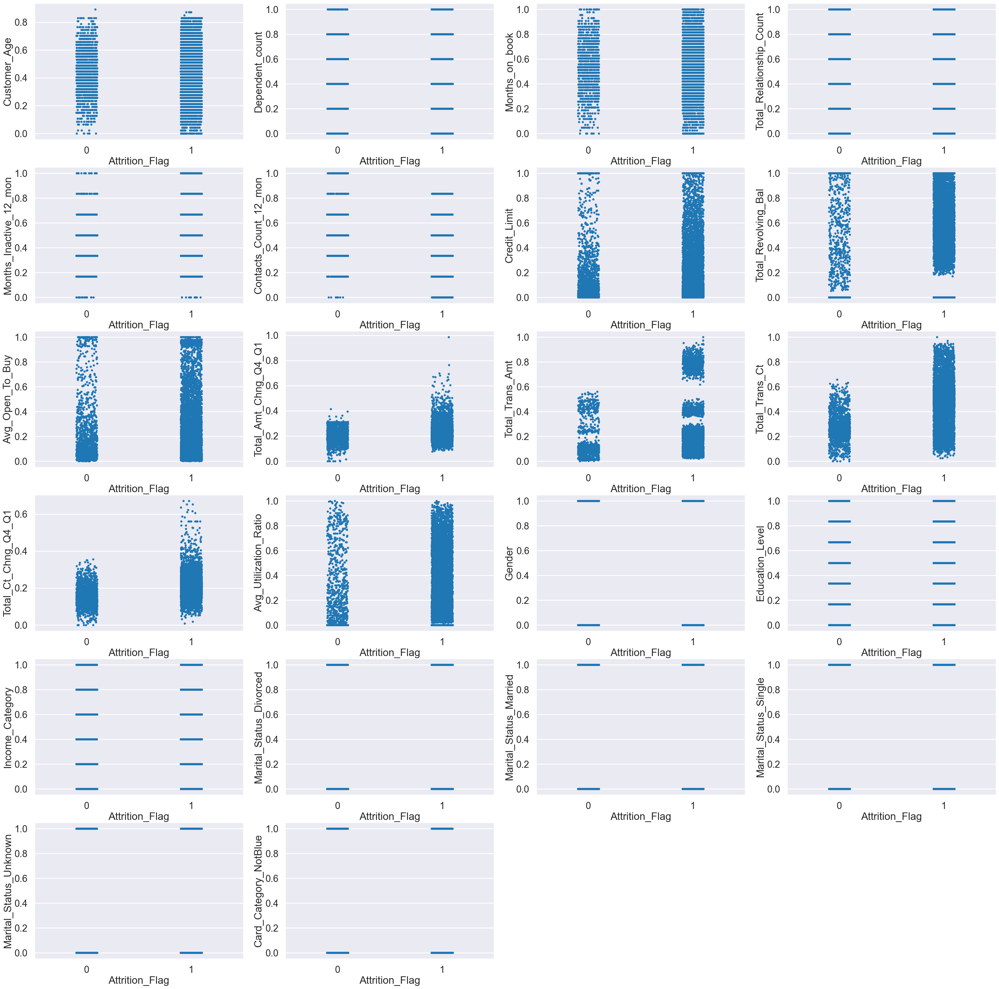

In [199]:
plt.figure(figsize=(40,40))
for idx, col in enumerate(dfTomek.columns):
    if col not in ["Attrition_Flag"]:
        plt.subplot(6,4,idx+1)
        sns.stripplot(x="Attrition_Flag", y=col, data=dfTomek)

### **Feature Selection**

In [200]:
selector_tm = SelectKBest(f_classif, k=9)
x_tm = dfTomek.drop(['Attrition_Flag'], axis = 1)
y_tm = dfTomek['Attrition_Flag']

df_tm_anova = selector_tm.fit(x_tm, y_tm)

col_tm = selector_tm.get_support(indices=True)
df_tm_anova = x_tm.iloc[:,col_tm]

#### **Concatenate Data**

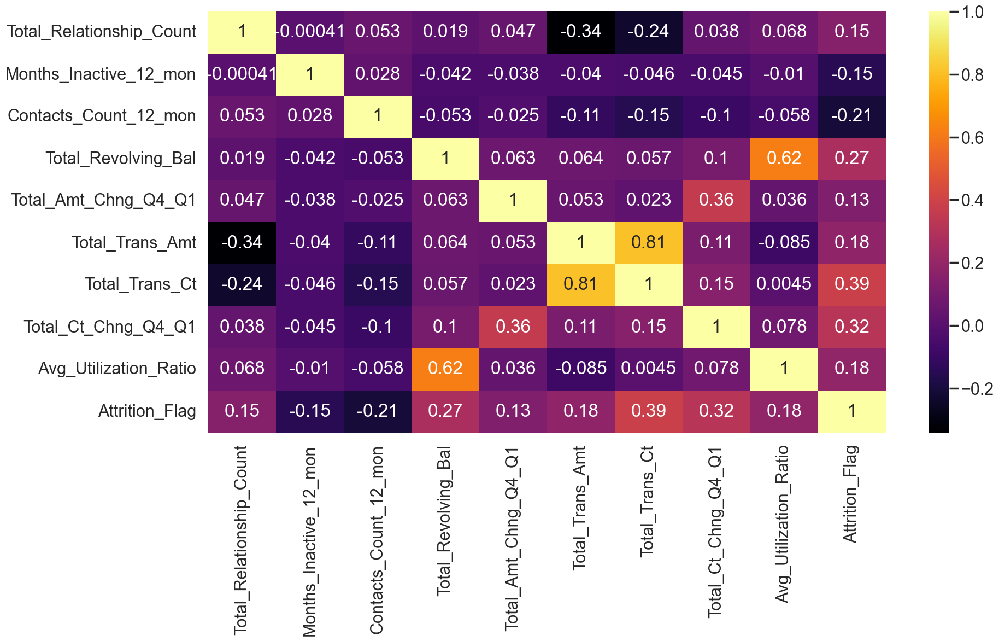

In [201]:
df_tm_anova = pd.concat([df_tm_anova, y_tm], axis=1)
checkCorrFF(df_tm_anova)

In [202]:
df_tm_anova.columns

Index(['Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Total_Revolving_Bal', 'Total_Amt_Chng_Q4_Q1',
       'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1',
       'Avg_Utilization_Ratio', 'Attrition_Flag'],
      dtype='object')

In [203]:
df_tm_anova.drop(['Avg_Utilization_Ratio','Total_Trans_Amt','Total_Amt_Chng_Q4_Q1'], axis=1, inplace=True)

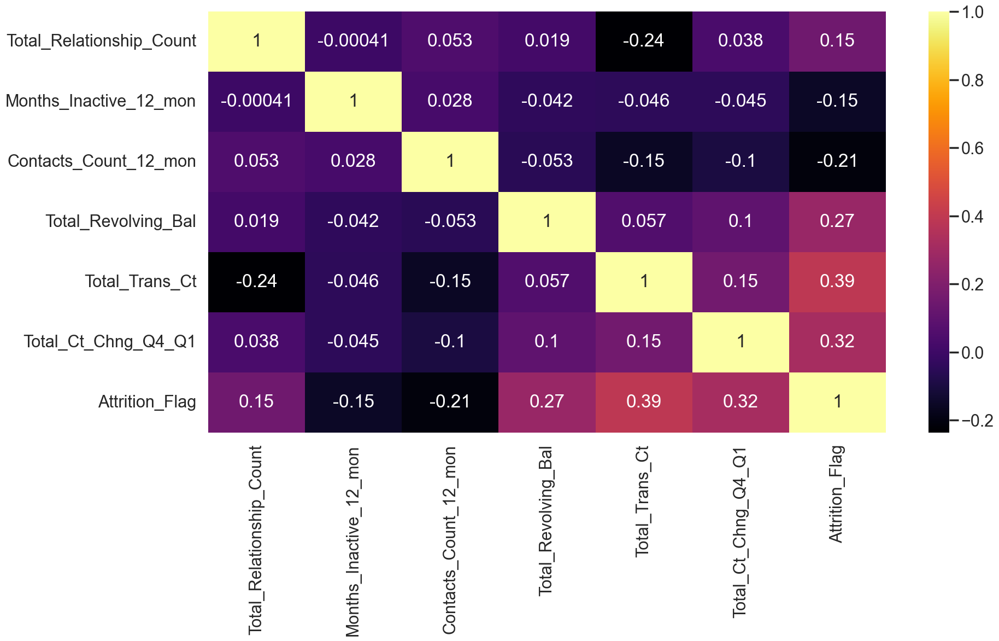

In [204]:
checkCorrFF(df_tm_anova)

## **Model Training**

### **Repeated k-Fold Cross-Validation**

>f1 score 1 mean=0.9387 se=0.003
>f1 score 2 mean=0.9390 se=0.002
>f1 score 3 mean=0.9388 se=0.001
>f1 score 4 mean=0.9387 se=0.001
>f1 score 5 mean=0.9387 se=0.001


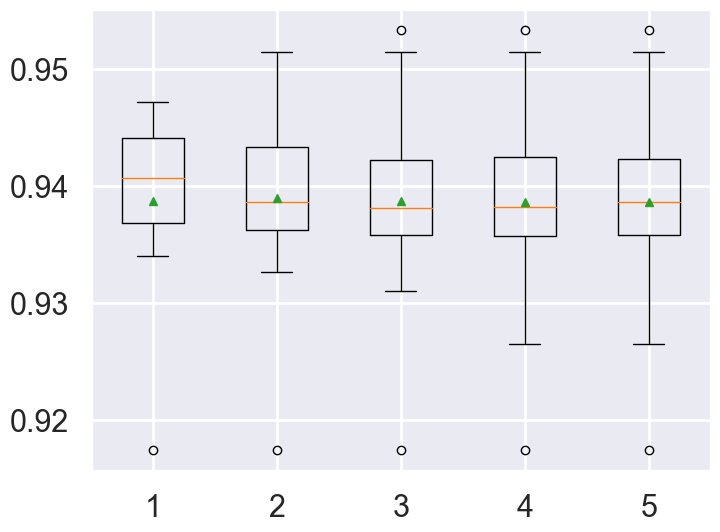

In [205]:
# create dataset
X_tm_anova = df_tm_anova.drop(['Attrition_Flag'], axis = 1)
y_tm_anova = df_tm_anova['Attrition_Flag']

_scoring = ['accuracy', 'precision', 'recall', 'f1']
# configurations to test
repeats = range(1,6)
results_tm_anova = list()
for r in repeats:
	# evaluate using a given number of repeats
	scores_tm_anova = evaluate_model(X_tm_anova, y_tm_anova, r,'f1')
	# summarize
	print('>f1 score %d mean=%.4f se=%.3f' % (r, np.mean(scores_tm_anova), sem(scores_tm_anova)))
	# store
	results_tm_anova.append(scores_tm_anova)
# plot the results
plt.boxplot(results_tm_anova, labels=[str(r) for r in repeats], showmeans=True)
plt.show()

### **GridSearchCV**

In [206]:
#get the dummy variables for the categorical variables
x_tm_anova = df_tm_anova.drop(['Attrition_Flag'], axis = 1)
y_tm_anova = df_tm_anova['Attrition_Flag']

x_tm_anova_train,x_tm_anova_test,y_tm_anova_train,y_tm_anova_test = train_test_split(x_tm_anova, y_tm_anova, test_size = 0.2, random_state = 0)

grid={"C":np.logspace(-6,6,13),
      # "class_weight":[None,"balanced"],
      "penalty":['none', 'elasticnet', 'l1', 'l2'],
      "solver":['newton-cg','lbfgs','liblinear','sag','saga']}
logreg_tm_anova=LogisticRegression()
logreg_cv_tm_anova=GridSearchCV(logreg_tm_anova
                       ,grid
                       ,cv=10
                       ,scoring='f1'
                       ,n_jobs=-1)
logreg_cv_tm_anova.fit(x_tm_anova_train,y_tm_anova_train)

print("tuned hpyerparameters :(best parameters) ",logreg_cv_tm_anova.best_params_)
print("f1 :",logreg_cv_tm_anova.best_score_)

tuned hpyerparameters :(best parameters)  {'C': 1.0, 'penalty': 'l2', 'solver': 'liblinear'}
f1 : 0.938688204143608


In [207]:
clf_tm_anova = LogisticRegression(C=logreg_cv_tm_anova.best_params_['C']
                                  , penalty=logreg_cv_tm_anova.best_params_['penalty']
                                  , solver=logreg_cv_tm_anova.best_params_['solver'])

clf_tm_anova.fit(x_tm_anova_train,y_tm_anova_train)
print("model score: %.8f" % clf_tm_anova.score(x_tm_anova_test, y_tm_anova_test))

model score: 0.89854290


### **Classification report**

In [208]:
# Classification report
y_tm_anova_pred = clf_tm_anova.predict(x_tm_anova_train)
print("Classification report \n=======================")
print(classification_report(y_true=y_tm_anova_train, y_pred=y_tm_anova_pred))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_tm_anova_train, y_pred=y_tm_anova_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.78      0.50      0.61      1237
           1       0.91      0.97      0.94      6175

    accuracy                           0.89      7412
   macro avg       0.85      0.74      0.78      7412
weighted avg       0.89      0.89      0.88      7412

Confusion matrix 
[[ 624  613]
 [ 173 6002]]


In [209]:
# Classification report
y_tm_anova_pred = clf_tm_anova.predict(x_tm_anova_test)
print("Classification report \n=======================")
print(classification_report(y_true=y_tm_anova_test, y_pred=y_tm_anova_pred))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=y_tm_anova_test, y_pred=y_tm_anova_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.77      0.56      0.65       308
           1       0.92      0.97      0.94      1545

    accuracy                           0.90      1853
   macro avg       0.84      0.76      0.79      1853
weighted avg       0.89      0.90      0.89      1853

Confusion matrix 
[[ 173  135]
 [  53 1492]]


# Test

In [210]:
log_var = ['Credit_Limit','Avg_Open_To_Buy',
           'Total_Amt_Chng_Q4_Q1','Total_Ct_Chng_Q4_Q1']

for idx,col in enumerate(log_var):
    df_LE_check[col] = np.log10(df_LE_check[col]+1)

In [211]:
min_max_scaler = MinMaxScaler()

for idx in df_LE_check.columns:
    if idx not in ['Attrition_Flag']:
        df_LE_check[idx]=min_max_scaler.fit_transform(df_LE_check[idx].values.reshape(-1,1))

In [215]:
clf_up_anova.feature_names_in_

check1 = df_LE_check.copy()

for col in df_LE_check.columns:
    if col not in clf_up_anova.feature_names_in_ and col != 'Attrition_Flag':
        check1.drop(col, axis=1, inplace=True)
check1.describe()

,Total_Relationship_Count,Contacts_Count_12_mon,Total_Revolving_Bal,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Marital_Status_Divorced,Marital_Status_Married,Attrition_Flag
count,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000
mean,0.580671,0.424392,0.457218,0.417323,0.332615,0.059172,0.459566,0.848126
std,0.301284,0.185032,0.318832,0.180789,0.097977,0.236179,0.498855,0.359253
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.400000,0.333333,0.200040,0.263780,0.284359,0.000000,0.000000,1.000000
50%,0.600000,0.500000,0.506953,0.433071,0.338987,0.000000,0.000000,1.000000
75%,0.800000,0.500000,0.692690,0.543307,0.382104,0.000000,1.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [216]:
checkx = check1.drop(['Attrition_Flag'], axis = 1)
checky = check1['Attrition_Flag']

y_pred = clf_up_anova.predict(checkx)
print("Classification report \n=======================")
print(classification_report(y_true=checky, y_pred=y_pred))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=checky, y_pred=y_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.37      0.84      0.52        77
           1       0.96      0.75      0.84       430

    accuracy                           0.76       507
   macro avg       0.67      0.80      0.68       507
weighted avg       0.87      0.76      0.79       507

Confusion matrix 
[[ 65  12]
 [109 321]]


In [218]:
clf_dw_anova.feature_names_in_

check2 = df_LE_check.copy()

for col in df_LE_check.columns:
    if col not in clf_dw_anova.feature_names_in_ and col != 'Attrition_Flag':
        check2.drop(col, axis=1, inplace=True)
check2.describe()

,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Attrition_Flag
count,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000,507.000000
mean,0.580671,0.399408,0.424392,0.457218,0.437062,0.417323,0.332615,0.848126
std,0.301284,0.169494,0.185032,0.318832,0.115444,0.180789,0.097977,0.359253
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.400000,0.333333,0.333333,0.200040,0.371832,0.263780,0.284359,1.000000
50%,0.600000,0.333333,0.500000,0.506953,0.427639,0.433071,0.338987,1.000000
75%,0.800000,0.500000,0.500000,0.692690,0.498103,0.543307,0.382104,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [217]:
# Classification report
checkx = check1.drop(['Attrition_Flag'], axis = 1)
checky = check1['Attrition_Flag']

y_pred = clf_dw_anova.predict(checkx)
print("Classification report \n=======================")
print(classification_report(y_true=checky, y_pred=y_pred))
print("Confusion matrix \n=======================")

print(confusion_matrix(y_true=checky, y_pred=y_pred))

Classification report 
              precision    recall  f1-score   support

           0       0.53      0.98      0.69      6234
           1       0.84      0.12      0.22      6121

    accuracy                           0.55     12355
   macro avg       0.69      0.55      0.45     12355
weighted avg       0.68      0.55      0.45     12355

Confusion matrix 
[[6089  145]
 [5360  761]]
